# Imports - REQUIRED

In [74]:
import os, os.path
import csv
import numpy as np
import pandas as pd
import matplotlib
import math
import matplotlib.pyplot as plt
import imageio
from glob import glob
from utils import *
import cv2
from scipy.ndimage import convolve
from skimage.draw import ellipse
from skimage.measure import label, regionprops, regionprops_table
from skimage.transform import rotate
# from skimage import data, filters, measure, morphology
from mpl_toolkits.axes_grid1 import make_axes_locatable
from textwrap import wrap
from sklearn.decomposition import PCA
from skimage.feature import hog
from sklearn.manifold import TSNE

import time

# Set Up Files and File Names - Train / Dev / Test Split - REQUIRED

In [2]:
# REQUIRED Set Up File Names 
# files = pd.read_csv('mavoc_partition_scheme.csv')
files = pd.read_csv('mavoc_balanced_scheme.csv')
files['eo_img'] = files['eo_img'].str[9:]
files['sar_img'] = files['sar_img'].str[9:]
files.head()

,image_id,eo_img,sar_img,label,partition
0,432192,EO_432192.png,SAR_432192.png,7,train
1,56011,EO_56011.png,SAR_56011.png,2,train
2,172676,EO_172676.png,SAR_172676.png,5,train
3,78915,EO_78915.png,SAR_78915.png,9,train
4,19355,EO_19355.png,SAR_19355.png,2,train


In [3]:
# REQUIRED
# Set up separate training, dev, and test set dataframes
train = files[files['partition'] == 'train']
dev = files[files['partition'] == 'dev']
test = files[files['partition'] == 'test']

In [27]:
train.shape

(4992, 5)

In [5]:
# REQUIRED
# Load Label Names
labels = ['sedan', # 0
          'suv', # 1
          'pickup truck', # 2
          'van', # 3
          'box truck', # 4
          'motorcycle', # 5
          'flatbed truck', # 6
          'bus', # 7
          'pickup truck with trailer', # 8
          'flatbed truck with trailer', # 9
         ]

In [6]:
# Set Root Directory Path - REQUIRED
rootdir = '../train_images'

In [8]:
# Test How to Call Files with a specific label
for i in range(10):
    print("Number of files for label " + str(i) + ": " + str(files[files['label'] == i]['eo_img'].size))

Number of files for label 0: 624
Number of files for label 1: 624
Number of files for label 2: 624
Number of files for label 3: 624
Number of files for label 4: 624
Number of files for label 5: 624
Number of files for label 6: 624
Number of files for label 7: 624
Number of files for label 8: 624
Number of files for label 9: 624


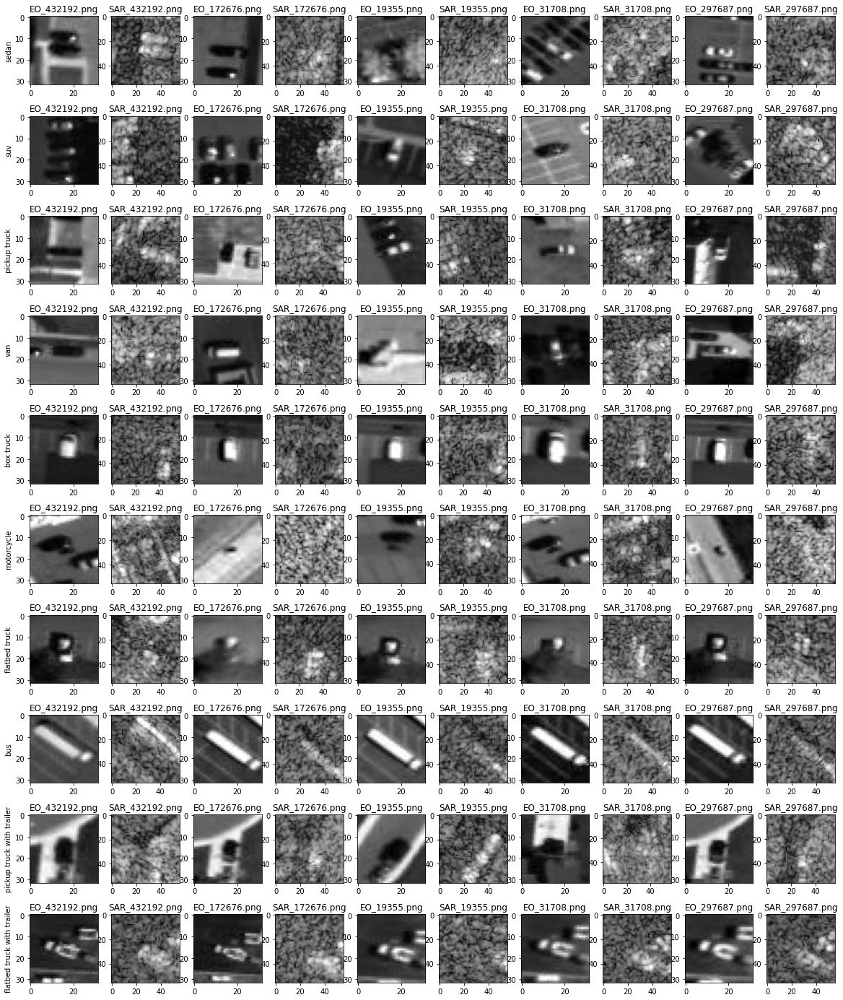

In [9]:
# TEST ONLY - OPTIONAL
# Open side-by-side the first 5 images for EO and SAR images for all labels in training set
fig, ax = plt.subplots(10, 10, figsize=(20,25))

# For all labels
for i in range(10):
    # For a sample of 5 images
    for j in range(0,10,2):
        # EO path
        path_eo = rootdir + "/" + str(i) + "/" + train[train['label'] == i]['eo_img'].iloc[j]
        # SAR path
        path_sar = rootdir + "/" + str(i) + "/" + train[train['label'] == i]['sar_img'].iloc[j]
        
        # Read images
        img_eo = plt.imread(path_eo)
        img_sar = plt.imread(path_sar)
        
        # Displaying the images
        ax[i][j].imshow(img_eo, cmap='gray')
        ax[i][j].set_title(train['eo_img'].iloc[j])
        ax[i][j+1].imshow(img_sar, cmap='gray')
        ax[i][j+1].set_title(train['sar_img'].iloc[j])
        
    ax[i][0].set_ylabel(labels[i])
    
plt.show()

# Data Exploration - OPTIONAL

In [9]:
# Checks that all EO and SAR images are represented in training set 

# rootdir = '../train_images'
# total_eo_files = 0
# total_sar_files = 0
# for file in os.listdir(rootdir):
#     d = os.path.join(rootdir, file)
#     if os.path.isdir(d):
#         eo_num_files = len([name for name in os.listdir(d) if os.path.isfile(os.path.join(d, name)) and name.startswith("EO")])
#         sar_num_files = len([name for name in os.listdir(d) if os.path.isfile(os.path.join(d, name)) and name.startswith("SAR")])
#         print("Directory %s (EO): %d" %(d, eo_num_files))
#         print("Directory %s (SAR): %d" %(d, sar_num_files))
#         total_eo_files += eo_num_files
#         total_sar_files += sar_num_files
# print(total_eo_files)
# print(total_sar_files)

## Mean signal levels

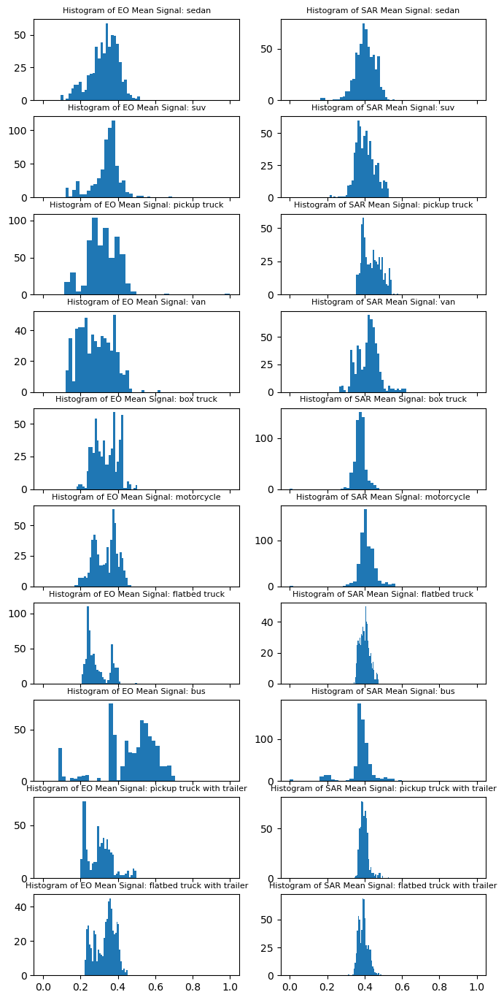

In [10]:
# Checks overall mean signal levels for first "num_images" images for each image across labels
num_images = 600

mean_eo_signals = np.zeros((10,num_images))
mean_sar_signals = np.zeros((10,num_images))

for i in range(10): # For all labels
    for j in range(num_images): # 
        # EO path
        path_eo = rootdir + "/" + str(i) + "/" + eo_filenames[i][j] 
        # SAR path
        path_sar = rootdir + "/" + str(i) + "/" + sar_filenames[i][j] 
        
        # Read images
        img_eo = plt.imread(path_eo)
        img_sar = plt.imread(path_sar)
        
        # Get mean for the image
        mean_eo_signals[i,j] = np.mean(img_eo)
        mean_sar_signals[i,j] = np.mean(img_sar)

# Plot distribution of mean signals for 200 images of each label
fig, ax = plt.subplots(10, 2, figsize=(8,17), sharex=True)

for i in range(10):
    ax[i][0].hist(mean_eo_signals[i], bins=30)
    ax[i][0].set_title("Histogram of EO Mean Signal: " + labels[i], fontsize=8)
    ax[i][1].hist(mean_sar_signals[i], bins=30)
    ax[i][1].set_title("Histogram of SAR Mean Signal: " + labels[i], fontsize=8)
        
plt.show()

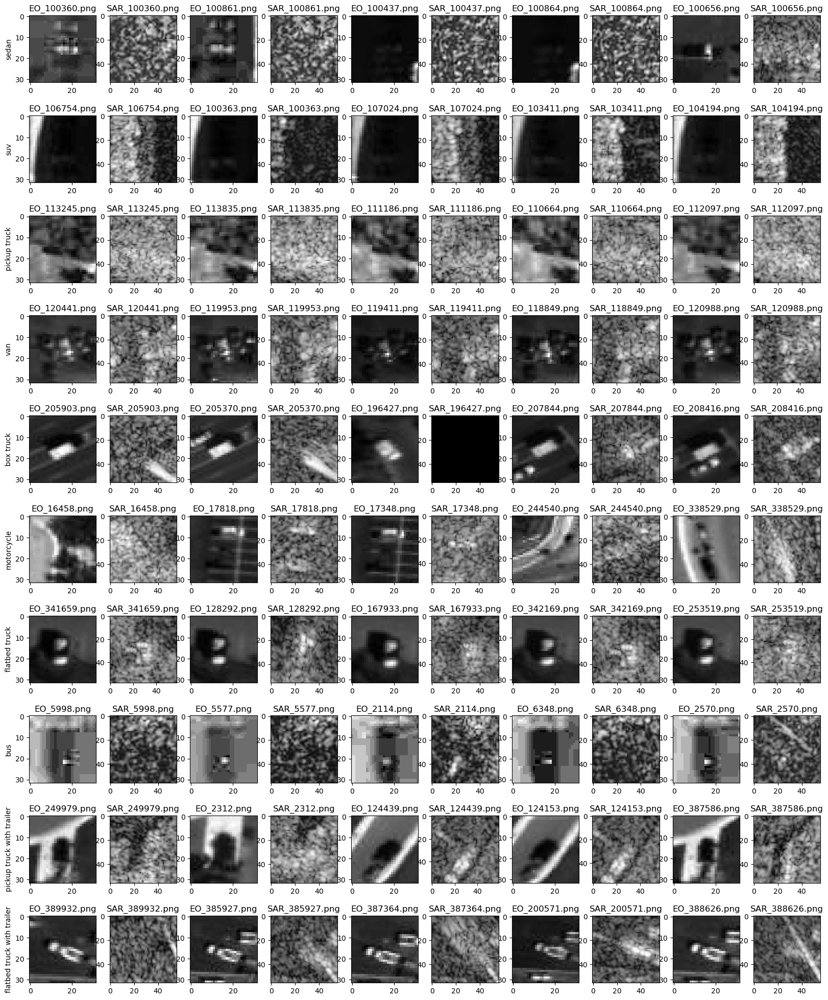

In [11]:
# Plot the lowest mean signal images for num_images number of images

ind = np.argsort(mean_eo_signals, axis=1)

eo_filenames[0][ind[0][0]] 

num_images = 5

fig, ax = plt.subplots(10, 2*num_images, figsize=(20,25))
for i in range(10): # For all labels
    for j in range(num_images): # 
        # EO path
        path_eo = rootdir + "/" + str(i) + "/" + eo_filenames[i][ind[i][j]]  
        path_sar = rootdir + "/" + str(i) + "/" + sar_filenames[i][ind[i][j]] 
        
        # Read images
        img_eo = plt.imread(path_eo)
        img_sar = plt.imread(path_sar)

        # Displaying the image
        ax[i][j*2].imshow(img_eo, cmap='gray')
        ax[i][j*2].set_title(eo_filenames[i][ind[i][j]])
        ax[i][j*2+1].imshow(img_sar, cmap='gray')
        ax[i][j*2+1].set_title(sar_filenames[i][ind[i][j]])
        
    ax[i][0].set_ylabel(labels[i])
    
plt.show()


In [12]:
# To Do: Review the EO images with low mean signals to see if quality is low (and should replace with SAR)

## Standard Deviations

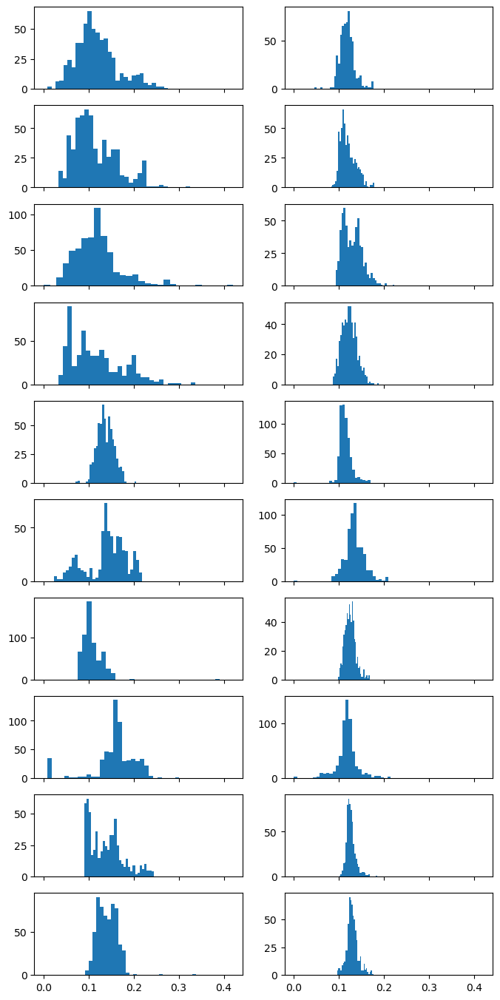

In [13]:
# Checks standard deviations for first "num_images" images for each image across labels
num_images = 600

std_eo_signals = np.zeros((10,num_images))
std_sar_signals = np.zeros((10,num_images))

for i in range(10): # For all labels
    for j in range(num_images): # 
        # EO path
        path_eo = rootdir + "/" + str(i) + "/" + eo_filenames[i][j] 
        # SAR path
        path_sar = rootdir + "/" + str(i) + "/" + sar_filenames[i][j] 
        
        # Read images
        img_eo = plt.imread(path_eo)
        img_sar = plt.imread(path_sar)
        
        # Get mean for the image
        std_eo_signals[i,j] = np.std(img_eo)
        std_sar_signals[i,j] = np.std(img_sar)

# Plot distribution of mean signals for 200 images of each label
fig, ax = plt.subplots(10, 2, figsize=(8,17), sharex=True)

for i in range(10):
    ax[i][0].hist(std_eo_signals[i], bins=30)
    ax[i][1].hist(std_sar_signals[i], bins=30)
        
plt.show()

0.008086783811450005
0.0932636484503746


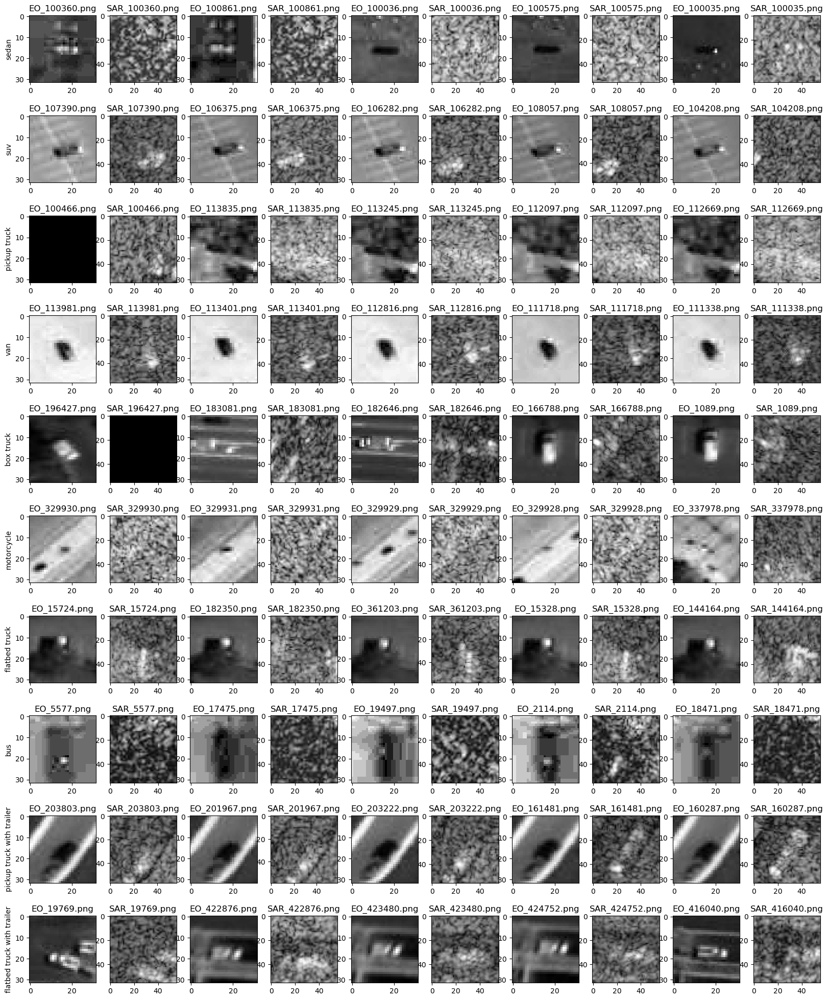

In [14]:
ind2 = np.argsort(std_eo_signals, axis=1)
print(std_eo_signals[0][ind2[0][0]])
print(mean_eo_signals[0][ind2[0][0]])
# Plot lowest std deviation images
num_images = 5

fig, ax = plt.subplots(10, 2*num_images, figsize=(20,25))
for i in range(10): # For all labels
    for j in range(num_images): # 
        # EO path
        path_eo = rootdir + "/" + str(i) + "/" + eo_filenames[i][ind2[i][j]]  
        path_sar = rootdir + "/" + str(i) + "/" + sar_filenames[i][ind2[i][j]] 
        
        # Read images
        img_eo = plt.imread(path_eo)
        img_sar = plt.imread(path_sar)

        # Displaying the image
        ax[i][j*2].imshow(img_eo, cmap='gray')
        ax[i][j*2].set_title(eo_filenames[i][ind2[i][j]])
        ax[i][j*2+1].imshow(img_sar, cmap='gray')
        ax[i][j*2+1].set_title(sar_filenames[i][ind2[i][j]])
        
    ax[i][0].set_ylabel(labels[i])
    
plt.show()


0.026272539049386978
0.0932636484503746


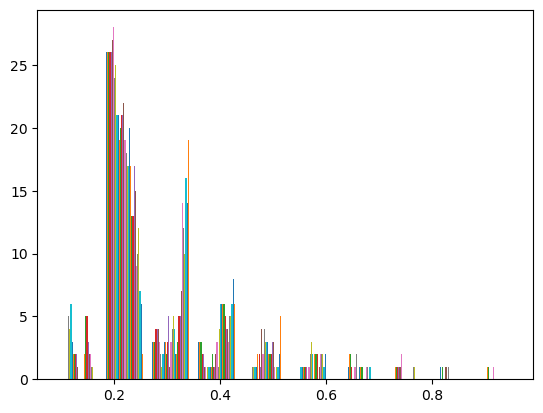

In [15]:
print(std_eo_signals[0][ind2[0][2]])
print(mean_eo_signals[0][ind2[0][0]])
ind2[0][0]
path_eo = rootdir + "/" + str(i) + "/" + eo_filenames[i][ind2[0][0]]  
path_sar = rootdir + "/" + str(i) + "/" + sar_filenames[i][ind2[0][0]] 

# Read images
img_eo = plt.imread(path_eo)
img_sar = plt.imread(path_sar)

# Displaying the image
# plt.imshow(img_eo, cmap='gray')
plt.hist(img_eo)
# ax[i][j*2].set_title(eo_filenames[i][ind[i][j]])
plt.show()

## Maximum signal levels

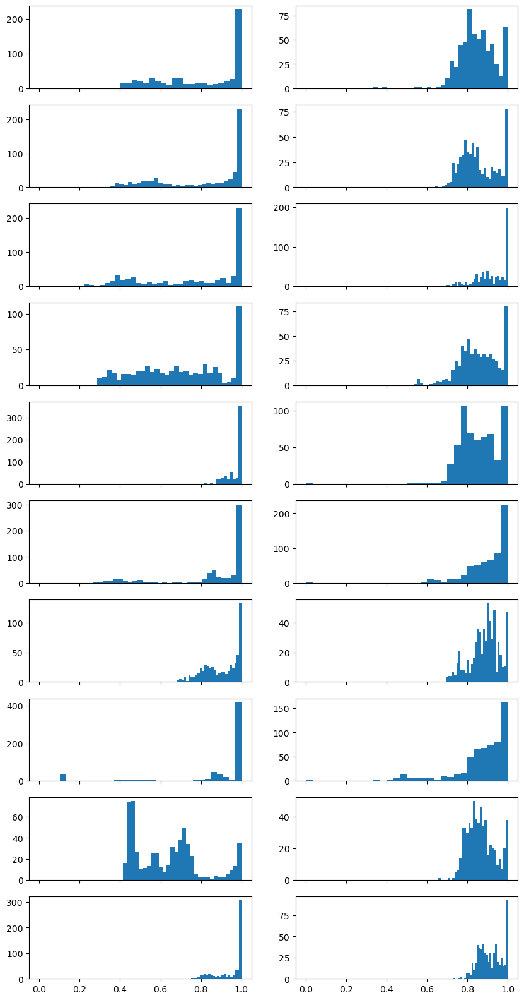

In [16]:
# Checks max value for first "num_images" images for each image across labels
num_images = 600

max_eo_signals = np.zeros((10,num_images))
max_sar_signals = np.zeros((10,num_images))

for i in range(10): # For all labels
    for j in range(num_images): # 
        # EO path
        path_eo = rootdir + "/" + str(i) + "/" + eo_filenames[i][j] 
        # SAR path
        path_sar = rootdir + "/" + str(i) + "/" + sar_filenames[i][j] 
        
        # Read images
        img_eo = plt.imread(path_eo)
        img_sar = plt.imread(path_sar)
        
        # Get max for the image
        max_eo_signals[i,j] = img_eo.max()
        max_sar_signals[i,j] = img_sar.max()

# Plot distribution of mean signals for 200 images of each label
fig, ax = plt.subplots(10, 2, figsize=(10,20), sharex=True)

for i in range(10):
    ax[i][0].hist(max_eo_signals[i], bins=30)
    ax[i][1].hist(max_sar_signals[i], bins=30)
        
plt.show()

0.14509804546833038
0.010977736674249172
0.0942784994840622


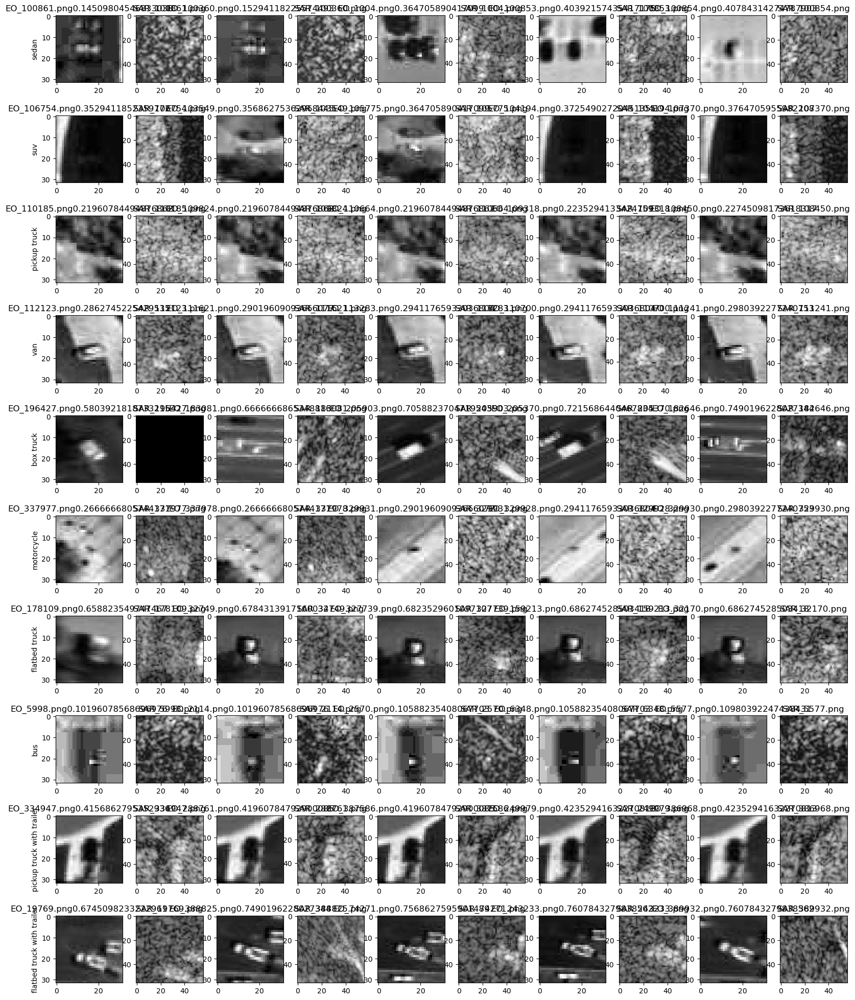

In [17]:
ind3 = np.argsort(max_eo_signals, axis=1)
print(max_eo_signals[0][ind3[0][0]])
print(std_eo_signals[0][ind3[0][0]])
print(mean_eo_signals[0][ind3[0][0]])
# Plot lowest std deviation images
num_images = 5

fig, ax = plt.subplots(10, 2*num_images, figsize=(20,25))
for i in range(10): # For all labels
    for j in range(num_images): # 
        # EO path
        path_eo = rootdir + "/" + str(i) + "/" + eo_filenames[i][ind3[i][j]]  
        path_sar = rootdir + "/" + str(i) + "/" + sar_filenames[i][ind3[i][j]] 
        
        # Read images
        img_eo = plt.imread(path_eo)
        img_sar = plt.imread(path_sar)

        # Displaying the image
        ax[i][j*2].imshow(img_eo, cmap='gray')
        ax[i][j*2].set_title(eo_filenames[i][ind3[i][j]] + str(max_eo_signals[i][ind3[i][j]]))
        ax[i][j*2+1].imshow(img_sar, cmap='gray')
        ax[i][j*2+1].set_title(sar_filenames[i][ind3[i][j]])
        
    ax[i][0].set_ylabel(labels[i])
    
plt.show()


In [18]:

ind3 = np.argsort(max_eo_signals, axis=1)
max_eo_signals[2][ind3[2][2]]

0.21960784494876862

# Feature Extraction & Tuning - OPTIONAL


## Create Gaussian Filters

In [7]:
from scipy import signal
import numpy as np

""" create a 2-D gaussian blurr filter for a given mean and std """
def create_2d_gaussian(size=9, std=1.5):
    gaussian_1d = signal.gaussian(size,std=std)
    gaussian_2d = np.outer(gaussian_1d, gaussian_1d)
    gaussian_2d = gaussian_2d/(gaussian_2d.sum())
    return gaussian_2d


""" normalize teh image between 0 and 1 """
def normalize_img(img):
    normalized = (img - img.min())/(img.max() - img.min())    
    return normalized

In [8]:
# create a function that takes in an two images,  
# uses the create_2d_gaussian method inside the utils script to create a 2D Gaussian filter
# then passes these filters to scipy.ndimage's convolve function
# finally, uses these blurred images to return a hybrid image

def hp_filter(im, size=15, std=7):
    # Create filters
    lp = create_2d_gaussian(size=size, std=std)
    imp = np.zeros((size,size))
    imp[int(size/2),int(size/2)] = 1
    hp = imp - lp
    
    # Convolve im2 with high pass filter
    out = convolve(im, hp)
    
    return out

def lp_filter(im, size=15, std=7):
    # Create filters
    lp = create_2d_gaussian(size=size, std=std)
    imp = np.zeros((size,size))
    imp[int(size/2),int(size/2)] = 1
    hp = imp - lp
    
    # Convolve images with filters
    # Convolve im1 with low pass filter
    out = convolve(im, lp)
    
    return out

## Noise Reduction (particularly on SAR)
1. Low Pass Filtering

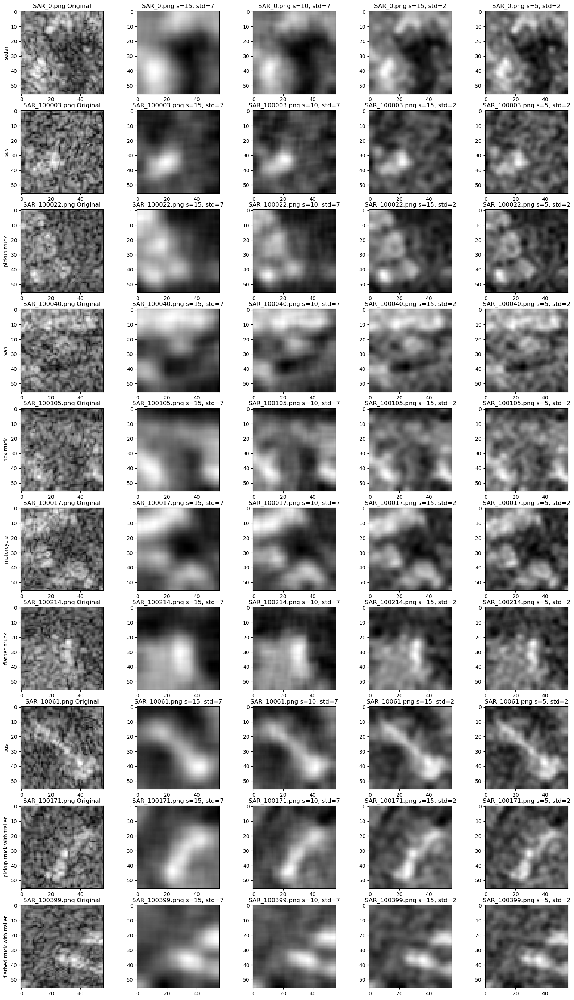

In [9]:
# Noise Reduce SAR Images by LP Filtering

s = 1
fig, ax = plt.subplots(10, s*5, figsize=(20,35))

for i in range(10):
    # For a sample of s images
    for j in range(0,s*5,5):
        # EO path
        path_eo = rootdir + "/" + str(i) + "/" + eo_filenames[i][j] 
        # SAR path
        path_sar = rootdir + "/" + str(i) + "/" + sar_filenames[i][j] 
        
        # Read images
        img_eo = plt.imread(path_eo)
        img_sar = plt.imread(path_sar)
        
        img_sar_lp1 = lp_filter(img_sar, size=15, std=7)
        img_sar_lp2 = lp_filter(img_sar, size=10, std=7)
        img_sar_lp3 = lp_filter(img_sar, size=15, std=2)
        img_sar_lp4 = lp_filter(img_sar, size=5, std=2)
        
        # Displaying the images
        ax[i][j].imshow(img_sar, cmap='gray')
        ax[i][j].set_title(sar_filenames[i][j] + " Original")
        ax[i][j+1].imshow(img_sar_lp1, cmap='gray')
        ax[i][j+1].set_title(sar_filenames[i][j] + " s=15, std=7")
        ax[i][j+2].imshow(img_sar_lp2, cmap='gray')
        ax[i][j+2].set_title(sar_filenames[i][j] + " s=10, std=7")
        ax[i][j+3].imshow(img_sar_lp3, cmap='gray')
        ax[i][j+3].set_title(sar_filenames[i][j] + " s=15, std=2")
        ax[i][j+4].imshow(img_sar_lp4, cmap='gray')
        ax[i][j+4].set_title(sar_filenames[i][j] + " s=5, std=2")
        
    ax[i][0].set_ylabel(labels[i])
    
plt.show()

## Sharpening (on EO first)

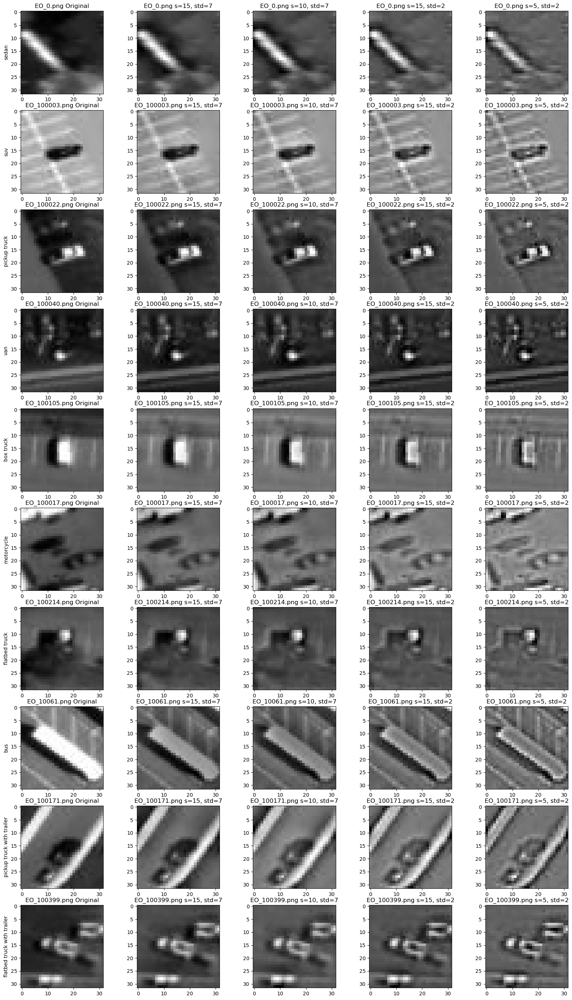

In [10]:
# Sharpen EO Images by HP Filtering

s = 1
fig, ax = plt.subplots(10, s*5, figsize=(20,35))

for i in range(10):
    # For a sample of s images
    for j in range(0,s*5,5):
        # EO path
        path_eo = rootdir + "/" + str(i) + "/" + eo_filenames[i][j] 
        # SAR path
        path_sar = rootdir + "/" + str(i) + "/" + sar_filenames[i][j] 
        
        # Read images
        img_eo = plt.imread(path_eo)
        img_sar = plt.imread(path_sar)
        
        img_eo_hp1 = hp_filter(img_eo, size=15, std=7)
        img_eo_hp2 = hp_filter(img_eo, size=10, std=7)
        img_eo_hp3 = hp_filter(img_eo, size=15, std=2)
        img_eo_hp4 = hp_filter(img_eo, size=5, std=2)
        
        # Displaying the images
        ax[i][j].imshow(img_eo, cmap='gray')
        ax[i][j].set_title(eo_filenames[i][j] + " Original")
        ax[i][j+1].imshow(img_eo_hp1, cmap='gray')
        ax[i][j+1].set_title(eo_filenames[i][j] + " s=15, std=7")
        ax[i][j+2].imshow(img_eo_hp2, cmap='gray')
        ax[i][j+2].set_title(eo_filenames[i][j] + " s=10, std=7")
        ax[i][j+3].imshow(img_eo_hp3, cmap='gray')
        ax[i][j+3].set_title(eo_filenames[i][j] + " s=15, std=2")
        ax[i][j+4].imshow(img_eo_hp4, cmap='gray')
        ax[i][j+4].set_title(eo_filenames[i][j] + " s=5, std=2")
        
    ax[i][0].set_ylabel(labels[i])
    
plt.show()

## Unsharp mask filtering on SAR Images

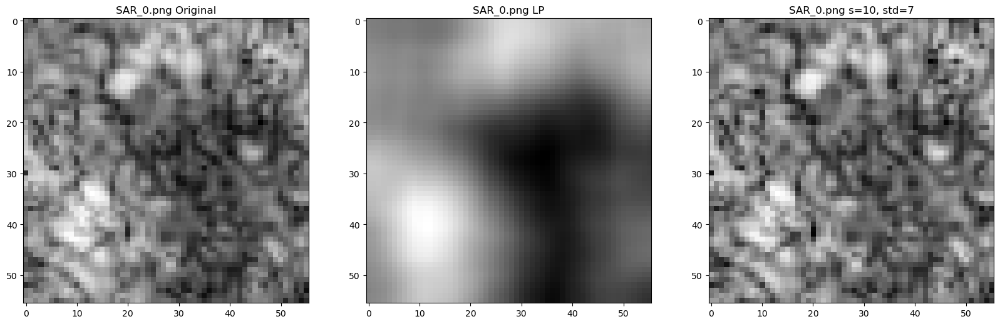

In [11]:
# Subtract the blurred image [Ib] from original image [I], to get the high frequency image: [Ih = I - Ib]. 
# Then add the high frequency image [Ih] back to the original [I] to get the unsharp mask image: [Is = I + Ih]
# Technique taken from Assignment 3. 

path_sar = rootdir + "/0/" + sar_filenames[0][0]


# Read images
img_sar = plt.imread(path_sar)

img_sar_lp = lp_filter(img_sar, size=15, std=7)
img_unsharp_mask = (img_sar - img_sar_lp) + img_sar
img_unsharp_mask_norm = normalize_img(img_unsharp_mask)

# Displaying the images
fig, ax = plt.subplots(1, 3, figsize=(20,35))
i = 0
j = 0
ax[j].imshow(img_sar, cmap='gray')
ax[j].set_title(sar_filenames[0][0] + " Original")
ax[j+1].imshow(img_sar_lp, cmap='gray')
ax[j+1].set_title(sar_filenames[0][0] + " LP")
ax[j+2].imshow(img_unsharp_mask_norm, cmap='gray')
ax[j+2].set_title(sar_filenames[0][0] + " s=10, std=7")
# ax[i][j+3].set_title(eo_filenames[i][j] + " s=15, std=2")
# ax[i][j+4].imshow(img_eo_hp4, cmap='gray')
# ax[i][j+4].set_title(eo_filenames[i][j] + " s=5, std=2")
plt.show()

## Edge Detection (after noise reduction for SAR and sharpening for EO)
Methods to employ:
1. Canny edge detector.
2. Directional Derivatives to Gradients
3. Histogram of gradients?



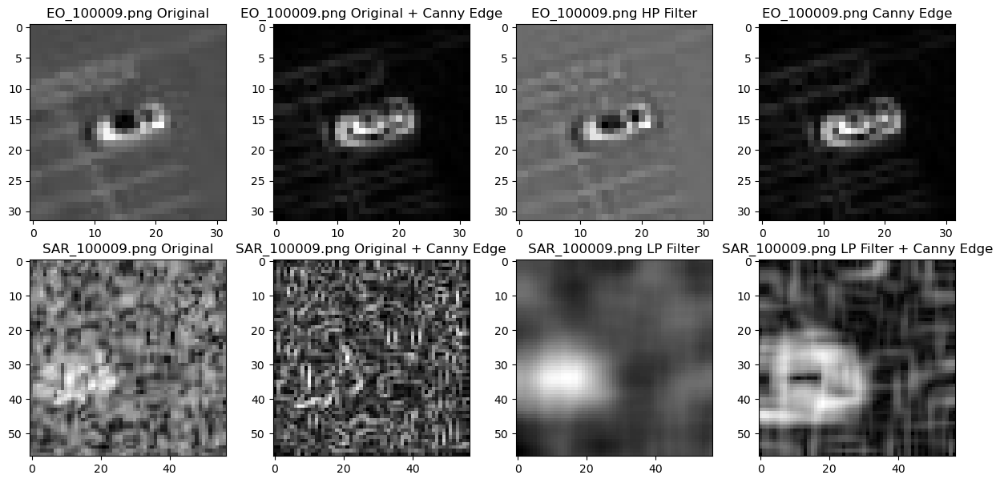

In [12]:
# Approach taken from least squares exercise
# Set labels and image # to access
i = 0 # Folder or Label Number
j = 10 # Image Number

# Get path to images
path_eo = rootdir + "/" + str(i) + "/"  + eo_filenames[i][j]
path_sar = rootdir + "/" + str(i) + "/" + sar_filenames[i][j]


# Read images
img_eo = plt.imread(path_eo)
img_sar = plt.imread(path_sar)

# Put EO image through HP filter
img_eo_hp = hp_filter(img_eo, size=5, std=2)
# img_eo_hp1 = hp_filter(img_eo, size=15, std=7)
# img_eo_hp2 = hp_filter(img_eo, size=10, std=7)
# img_eo_hp3 = hp_filter(img_eo, size=15, std=2)
# img_eo_hp4 = hp_filter(img_eo, size=5, std=2)
# img_eo_hp = img_eo # use this if don't want to apply filter

# Put SAR image through LP filter
img_sar_lp = lp_filter(img_sar, size=15, std=7)
# img_sar_lp = img_sar # use this if don't want to apply filter

# Normalize images
if np.max(img_eo)>1:
    img_eo = normalize(img_eo)
    
if np.max(img_sar_lp)>1:
    img_sar_lp = normalize(img_sar_lp)
    
# Compute edges of the EO image 
# TODO: decide the ksize for extracting the edges
eo_sobelx = cv2.Sobel(img_eo,cv2.CV_32F,1,0, ksize=3) # Find x and y gradients
eo_sobely = cv2.Sobel(img_eo,cv2.CV_32F,0,1, ksize=3)
eo_magnitude = np.sqrt(eo_sobelx**2.0 + eo_sobely**2.0)
eo_magnitude = eo_magnitude/np.max(eo_magnitude) # normalize

# Compute edges of the EO image + HP Filter
# TODO: decide the ksize for extracting the edges
eo_hp_sobelx = cv2.Sobel(img_eo_hp,cv2.CV_32F,1,0, ksize=3) # Find x and y gradients
eo_hp_sobely = cv2.Sobel(img_eo_hp,cv2.CV_32F,0,1, ksize=3)
eo_hp_magnitude = np.sqrt(eo_hp_sobelx**2.0 + eo_hp_sobely**2.0)
eo_hp_magnitude = eo_hp_magnitude/np.max(eo_hp_magnitude) # normalize
    
# Compute edges of the SAR image 
# TODO: decide the ksize for extracting the edges
sar_sobelx = cv2.Sobel(img_sar,cv2.CV_32F,1,0, ksize=3) # Find x and y gradients
sar_sobely = cv2.Sobel(img_sar,cv2.CV_32F,0,1, ksize=3)
sar_magnitude = np.sqrt(sar_sobelx**2.0 + sar_sobely**2.0)
sar_magnitude = sar_magnitude/np.max(sar_magnitude) # normalize

# Compute edges of the SAR image + LP Filter
# TODO: decide the ksize for extracting the edges
sar_lp_sobelx = cv2.Sobel(img_sar_lp,cv2.CV_32F,1,0, ksize=3) # Find x and y gradients
sar_lp_sobely = cv2.Sobel(img_sar_lp,cv2.CV_32F,0,1, ksize=3)
sar_lp_magnitude = np.sqrt(sar_lp_sobelx**2.0 + sar_lp_sobely**2.0)
sar_lp_magnitude = sar_lp_magnitude/np.max(sar_lp_magnitude) # normalize


# Display Plots
# EO
fig, ax = plt.subplots(2, 4, figsize=(15,7))
ax[0][0].imshow(img_eo, cmap='gray')
ax[0][0].set_title(eo_filenames[i][j] + " Original")
ax[0][1].imshow(eo_magnitude, cmap='gray')
ax[0][1].set_title(eo_filenames[i][j] + " Original + Canny Edge")
ax[0][2].imshow(img_eo_hp, cmap='gray')
ax[0][2].set_title(eo_filenames[i][j] + " HP Filter")
ax[0][3].imshow(eo_magnitude, cmap='gray')
ax[0][3].set_title(eo_filenames[i][j] + " Canny Edge")
# SAR
ax[1][0].imshow(img_sar, cmap='gray')
ax[1][0].set_title(sar_filenames[i][j] + " Original")
ax[1][1].imshow(sar_magnitude, cmap='gray')
ax[1][1].set_title(sar_filenames[i][j] + " Original + Canny Edge")
ax[1][2].imshow(img_sar_lp, cmap='gray')
ax[1][2].set_title(sar_filenames[i][j] + " LP Filter")
ax[1][3].imshow(sar_lp_magnitude, cmap='gray')
ax[1][3].set_title(sar_filenames[i][j] + " LP Filter + Canny Edge")


# create an axes on the right side of ax. The width of cax will be 5%
# of ax and the padding between cax and ax will be fixed at 0.05 inch.
# divider = make_axes_locatable(ax)
# cax = divider.append_axes("right", size="5%", pad=0.05)
# plt.colorbar(im_ax, cax=cax)
plt.show()


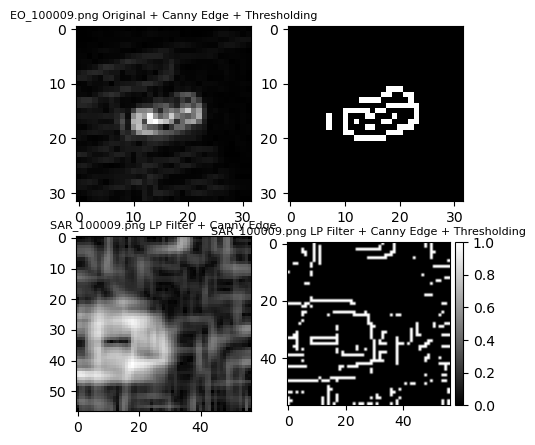

In [13]:
# Threshold the image for the EO original image (no HP filter) + Canny Edge and the SAR LP filtered + Canny Edge


eo_magnitude = eo_magnitude
eo_magnitude = eo_magnitude/np.max(eo_magnitude) # normalize

eo_im_threshold = cv2.Canny(image=(eo_magnitude*255).astype(np.uint8), threshold1=200, threshold2=255) # Canny Edge 
eo_im_threshold = eo_im_threshold / np.max(eo_im_threshold) # normalize


sar_magnitude = sar_lp_magnitude
sar_magnitude = sar_magnitude/np.max(sar_magnitude) # normalize

sar_im_threshold = cv2.Canny(image=(sar_magnitude*255).astype(np.uint8), threshold1=250, threshold2=255) # Canny Edge 
sar_im_threshold = sar_im_threshold / np.max(sar_im_threshold) # normalize

# Display Plots
# EO

fig, ax = plt.subplots(2, 2, figsize=(5,5))

ax[0][0].imshow(eo_magnitude, cmap='gray')
ax[0][0].set_title(eo_filenames[i][j] + " Original + Canny Edge", fontsize=8)
im0 = ax[0][1].imshow(eo_im_threshold, cmap='gray')
ax[0][0].set_title(eo_filenames[i][j] + " Original + Canny Edge + Thresholding", fontsize=8)
# SAR
ax[1][0].imshow(sar_lp_magnitude, cmap='gray')
ax[1][0].set_title(sar_filenames[i][j] + " LP Filter + Canny Edge", fontsize=8)
im1 = ax[1][1].imshow(sar_im_threshold, cmap='gray')
ax[1][1].set_title(sar_filenames[i][j] + " LP Filter + Canny Edge + Thresholding", fontsize=8)
divider = make_axes_locatable(ax[1][1])
cax = divider.append_axes("right", size="5%", pad=0.05)
plt.colorbar(im0, ax = ax[0][1], cax=cax)
plt.colorbar(im1, ax = ax[1][1], cax=cax)
plt.show()

# display the points
# fig, ax = plt.subplots(figsize=(5,5))
# im_ax = plt.imshow(eo_im_threshold, cmap='gray')
# # create an axes on the right side of ax. The width of cax will be 5%
# # of ax and the padding between cax and ax will be fixed at 0.05 inch.

# plt.colorbar(im_ax, cax=cax)
# plt.show()


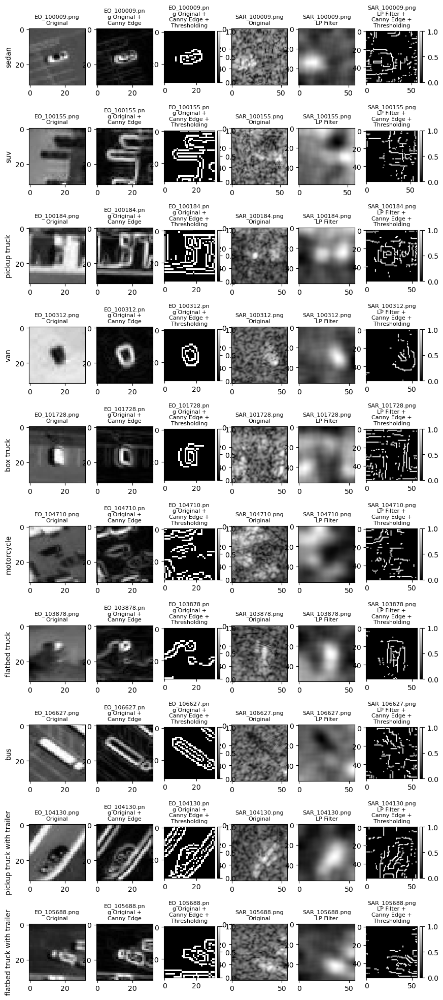

In [111]:
# Approach taken from least squares exercise
# Set labels and image # to access

# Display Plots
fig, ax = plt.subplots(10, 6, figsize=(10,25))

# Initialize eo and sar thresholding images and filenames to save for later
eo_im_thresholds = []
eo_im_filenames = []
sar_im_thresholds = []
sar_im_filenames = []

for i in range(10): # Folder or Label Number
    j = 10 # Image Number (randomnly chosen - can change to a loop if want to include more images)

    # Get path to images
    eo_im_filenames.append(eo_filenames[i][j])
    sar_im_filenames.append(sar_filenames[i][j])
    path_eo = rootdir + "/" + str(i) + "/"  + eo_filenames[i][j]
    path_sar = rootdir + "/" + str(i) + "/" + sar_filenames[i][j]

    # Read images
    img_eo = plt.imread(path_eo)
    img_sar = plt.imread(path_sar)

    # Put SAR image through LP filter
    img_sar_lp = lp_filter(img_sar, size=15, std=7)
    

    # Normalize images
    if np.max(img_eo)>1:
        img_eo = normalize(img_eo)

    if np.max(img_sar_lp)>1:
        img_sar_lp = normalize(img_sar_lp)
    
    # Compute edges of the EO image 
    # TODO: decide the ksize for extracting the edges
    eo_sobelx = cv2.Sobel(img_eo,cv2.CV_32F,1,0, ksize=3) # Find x and y gradients
    eo_sobely = cv2.Sobel(img_eo,cv2.CV_32F,0,1, ksize=3)
    eo_magnitude = np.sqrt(eo_sobelx**2.0 + eo_sobely**2.0)
    eo_magnitude = eo_magnitude/np.max(eo_magnitude) # normalize
    
    # Compute EO thresholds
    eo_im_threshold = cv2.Canny(image=(eo_magnitude*255).astype(np.uint8), threshold1=200, threshold2=255) # Canny Edge 
    eo_im_threshold = eo_im_threshold / np.max(eo_im_threshold) # normalize
    eo_im_thresholds.append(eo_im_threshold)
    
    # Compute edges of the SAR image + LP Filter
    # TODO: decide the ksize for extracting the edges
    sar_lp_sobelx = cv2.Sobel(img_sar_lp,cv2.CV_32F,1,0, ksize=3) # Find x and y gradients
    sar_lp_sobely = cv2.Sobel(img_sar_lp,cv2.CV_32F,0,1, ksize=3)
    sar_lp_magnitude = np.sqrt(sar_lp_sobelx**2.0 + sar_lp_sobely**2.0)
    sar_lp_magnitude = sar_lp_magnitude/np.max(sar_lp_magnitude) # normalize
    
    # Compute SAR thresholds
    sar_im_threshold = cv2.Canny(image=(sar_lp_magnitude*255).astype(np.uint8), threshold1=250, threshold2=255) # Canny Edge 
    sar_im_threshold = sar_im_threshold / np.max(sar_im_threshold) # normalize
    sar_im_thresholds.append(sar_im_threshold)

    # Plot EO
    ax[i][0].imshow(img_eo, cmap='gray')
    ax[i][0].set_title('\n'.join(wrap(eo_filenames[i][j] + " Original",15)), fontsize=8)
    ax[i][1].imshow(eo_magnitude, cmap='gray')
    ax[i][1].set_title('\n'.join(wrap(eo_filenames[i][j] + " Original + Canny Edge",12)), fontsize=8)
    ax[i][2].set_title('\n'.join(wrap(eo_filenames[i][j] + " Original + Canny Edge + Thresholding",12)), fontsize=8)
    im0 = ax[i][2].imshow(eo_im_threshold, cmap='gray')
    divider = make_axes_locatable(ax[i][2])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im0, ax = ax[i][2], cax=cax)

    # Plot SAR
    ax[i][3].imshow(img_sar, cmap='gray')
    ax[i][3].set_title('\n'.join(wrap(sar_filenames[i][j] + " Original",15)), fontsize=8)
    ax[i][4].imshow(img_sar_lp, cmap='gray')
    ax[i][4].set_title(sar_filenames[i][j] + " LP Filter", fontsize=8)
    ax[i][4].set_title('\n'.join(wrap(sar_filenames[i][j] + " LP Filter",15)), fontsize=8)
    ax[i][5].set_title('\n'.join(wrap(sar_filenames[i][j] + " LP Filter + Canny Edge + Thresholding",15)), fontsize=8)
    im1 = ax[i][5].imshow(sar_im_threshold, cmap='gray')
    divider = make_axes_locatable(ax[i][5])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im1, ax = ax[i][5], cax=cax)
    
    # Set label name for each row
    ax[i][0].set_ylabel(labels[i])

plt.show()


Notes:
* SAR and EO images not fully aligned.

Next steps: Use rectangle or shape detection on the sample thresholded images stored in eo_im_thresholds and sar_im_thresholds, with the filenames eo_im_filenames and sar_im_filenames.

In [27]:
eo_im_filenames

['EO_100009.png',
 'EO_100155.png',
 'EO_100184.png',
 'EO_100312.png',
 'EO_101728.png',
 'EO_104710.png',
 'EO_103878.png',
 'EO_106627.png',
 'EO_104130.png',
 'EO_105688.png']

In [28]:
sar_im_filenames

['SAR_100009.png',
 'SAR_100155.png',
 'SAR_100184.png',
 'SAR_100312.png',
 'SAR_101728.png',
 'SAR_104710.png',
 'SAR_103878.png',
 'SAR_106627.png',
 'SAR_104130.png',
 'SAR_105688.png']

In [193]:
from scipy.signal import sepfir2d
#compute space-time derivatives
# img_path = 'C:/Users/shirl/Documents/Documents/UCB/W281/Final project/EO_145726.png'
i = 5
j = 10
img_path = rootdir + "/" + str(i) + "/"  + eo_filenames[i][j]
img = plt.imread(img_path)
p = [0.030320, 0.249724, 0.439911, 0.249724, 0.030320]
d = [-0.104550, -0.292315, 0.0, 0.292315, 0.104550]
img_x = sepfir2d(img, d, p)
img_y = sepfir2d(img, p, d)

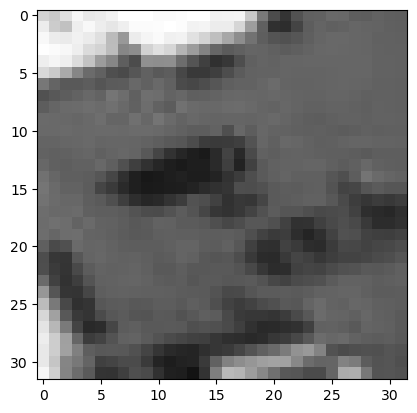

In [194]:
# Display original image
img = cv2.imread(img_path)
plt.imshow(img)
# cv2.waitKey(0)  
plt.show()

In [195]:
# Convert to graycsale
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# Blur the image for better edge detection
img_blur = cv2.GaussianBlur(img_gray, (3,3), 0)
# Sobel Edge Detection
sobelx = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5) # Sobel Edge Detection on the X axis
sobely = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5) # Sobel Edge Detection on the Y axis
sobelxy = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=5) # Combined X and Y Sobel Edge Detection

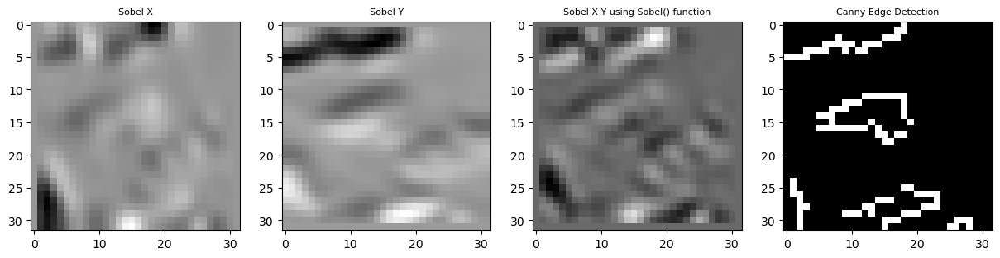

In [196]:
fig, ax = plt.subplots(1, 4, figsize = (15, 10))

ax[0].imshow(sobelx, cmap="gray")
ax[0].set_title('Sobel X', fontsize=8)
# cv2.waitKey(0)
ax[1].imshow(sobely, cmap="gray")
ax[1].set_title('Sobel Y', fontsize=8)
# cv2.waitKey(0)
ax[2].imshow(sobelxy, cmap="gray")
ax[2].set_title('Sobel X Y using Sobel() function', fontsize=8)
# cv2.waitKey(0)
# Canny Edge Detection
edges = cv2.Canny(image=img_blur, threshold1=100, threshold2=200) # Canny Edge Detection
# Display Canny Edge Detection Image
ax[3].imshow(edges, cmap="gray")
ax[3].set_title('Canny Edge Detection', fontsize=8)

plt.show()

# Shape Detection (using ski-image measure) - REQUIRED

## Testing and Tuning - OPTIONAL

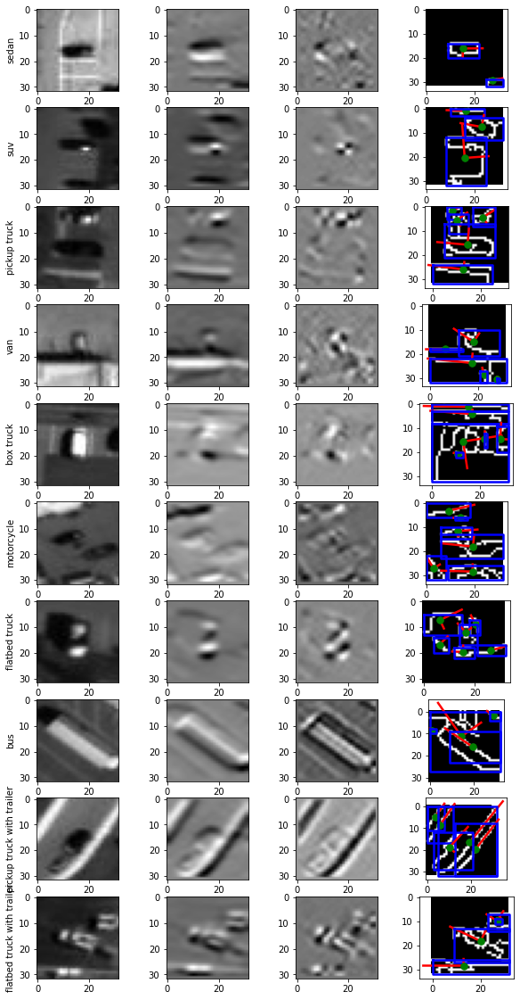

In [11]:
# TESTING AND TUNING ONLY
# Approach taken from least squares exercise
# Set labels and image # to access

# Display Plots

# Initialize eo and sar thresholding images and filenames to save for later
eo_im_thresholds = []
eo_im_filenames = []

fig, ax = plt.subplots(10, 4, figsize = (10, 20))
for i in range(10): # Folder or Label Number
    j = 30 # Image Number (randomnly chosen - can change to a loop if want to include more images)

    # Get path to images - Loop through each label
    filename = train[train['label'] == i]['eo_img'].iloc[j]
    eo_im_filenames.append(train[train['label'] == i]['eo_img'].iloc[j])
    path_eo = rootdir + "/" + str(i) + "/" + train[train['label'] == i]['eo_img'].iloc[j]
    # print(eo_filenames[i][j])
    
    # # Get path to images - Loop through images of the same label
    # eo_im_filenames.append(eo_filenames[i][j])
    # path_eo = rootdir + "/" + str(0) + "/"  + eo_filenames[0][i]
    # print(eo_filenames[i][j])

    # Read images
    img_eo = cv2.imread(path_eo)
    
    # Convert to graycsale
    img_gray = cv2.cvtColor(img_eo, cv2.COLOR_BGR2GRAY)
    
    ### Shirley's Addition ###
    # Blur the image for better edge detection
    img_blur = cv2.GaussianBlur(img_gray, (3,3), 0)
    
    # Try not blurring
    # img_blur = img_gray
    
    # Sobel Edge Detection
    sobelx = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=3) # Sobel Edge Detection on the X axis
    sobely = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=3) # Sobel Edge Detection on the Y axis
    sobelxy = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=3) # Combined X and Y Sobel Edge Detection

    # Alternate Method
    edges = cv2.Canny(image=img_blur, threshold1=0, threshold2=100) # Canny Edge Detection

    # Get shapes
    # https://scikit-image.org/docs/stable/auto_examples/segmentation/plot_regionprops.html
    label_img = label(edges)
    properties = ['area', 'eccentricity', 'perimeter', 'intensity_mean']
    regions = regionprops(label_img)
    
    # Plot EO
    
    ax[i][0].imshow(img_gray, cmap="gray")
    ax[i][1].imshow(sobely, cmap="gray")
    ax[i][2].imshow(sobelxy, cmap="gray")
    # Canny Edge Detection
    # Display Canny Edge Detection Image
    ax[i][3].imshow(edges, cmap=plt.cm.gray)

    for props in regions:
        
        y0, x0 = props.centroid
        orientation = props.orientation
        x1 = x0 + math.cos(orientation) * 0.5 * props.minor_axis_length
        y1 = y0 - math.sin(orientation) * 0.5 * props.minor_axis_length
        x2 = x0 - math.sin(orientation) * 0.5 * props.major_axis_length
        y2 = y0 - math.cos(orientation) * 0.5 * props.major_axis_length

        ax[i][3].plot((x0, x1), (y0, y1), '-r', linewidth=2.5)
        ax[i][3].plot((x0, x2), (y0, y2), '-r', linewidth=2.5)
        ax[i][3].plot(x0, y0, '.g', markersize=15)

        minr, minc, maxr, maxc = props.bbox
        bx = (minc, maxc, maxc, minc, minc)
        by = (minr, minr, maxr, maxr, minr)
        ax[i][3].plot(bx, by, '-b', linewidth=2.5)

    # ax.axis((0, 600, 600, 0))
    
    # Set label name for each row
    ax[i][0].set_ylabel(labels[i])
    
    props = pd.DataFrame(regionprops_table(label_img, properties=('centroid', # Provides coordinates of center of centroid relative to top left corner (centroid-0 is row or y-coordinate, centroid-1 is column or x-coordinate)
                                                     'area', # number of pixels of the region scaled by pixel-area
                                                     'orientation', # Relative to 12-oclock position, in radians. Positive is counter-clockwise, negative is clockwise. 
                                                     'perimeter',
                                                     'major_axis_length', 
                                                     'minor_axis_length')))
    
    props['axis_ratio'] =  props['major_axis_length']/props['minor_axis_length'] 
    # print(props)
    
plt.show()

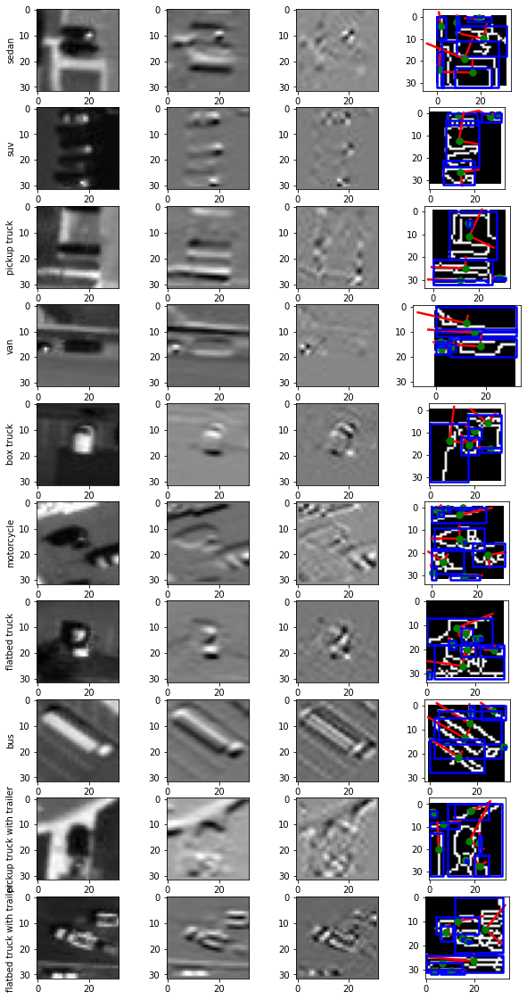

In [12]:
# TESTING AND TUNING ONLY

# Filter only the ones in range 

# Display Plots

# Initialize eo and sar thresholding images and filenames to save for later
eo_im_thresholds = []
eo_im_filenames = []

# Initialize filtered labels and shapes dataframe to store labels for shapes that are filtered 
# to acceptable areas/sizes and dataframes that contain the shape information
filtered_labels = []
shapes_df = []

fig, ax = plt.subplots(10, 4, figsize = (10, 20))
for i in range(10): # Folder or Label Number
    j = 0 # Image Number (randomnly chosen - can change to a loop if want to include more images)

    # Get path to images - Loop through each label
    eo_im_filenames.append(train[train['label'] == i]['eo_img'].iloc[j])
    path_eo = rootdir + "/" + str(i) + "/" + train[train['label'] == i]['eo_img'].iloc[j]
    
    # # Get path to images - Loop through images of the same label
    # eo_im_filenames.append(eo_filenames[i][j])
    # path_eo = rootdir + "/" + str(0) + "/"  + eo_filenames[0][i]
    # print(eo_filenames[i][j])

    # Read images
    img_eo = cv2.imread(path_eo)
    
    # Convert to graycsale
    img_gray = cv2.cvtColor(img_eo, cv2.COLOR_BGR2GRAY)
    
    ### Shirley's Addition ###
    # Blur the image for better edge detection
    img_blur = cv2.GaussianBlur(img_gray, (5,5), 0)
    
    # Try not blurring
    img_blur = img_gray
    
    # Sobel Edge Detection
    sobelx = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=3) # Sobel Edge Detection on the X axis
    sobely = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=3) # Sobel Edge Detection on the Y axis
    sobelxy = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=3) # Combined X and Y Sobel Edge Detection

    # Canny Edge Detection
    # Alternate Method
    edges = cv2.Canny(image=img_blur, threshold1=0, threshold2=100) # Canny Edge Detection

    # Get shapes
    # https://scikit-image.org/docs/stable/auto_examples/segmentation/plot_regionprops.html
    label_img = label(edges)
    properties = ['area', 'eccentricity', 'perimeter', 'intensity_mean']
    regions = regionprops(label_img)
    
    # Plot Original Image and Canny Edges
    ax[i][0].imshow(img_gray, cmap="gray")
    ax[i][1].imshow(sobely, cmap="gray")
    ax[i][2].imshow(sobelxy, cmap="gray")
    ax[i][3].imshow(edges, cmap=plt.cm.gray)
    
    filtered_labels.append([])
    for props in regions:
        # print(props.area, (props.axis_major_length/props.axis_minor_length if props.axis_minor_length != 0 else 0))
        axis_ratio = props.major_axis_length/props.minor_axis_length if props.minor_axis_length != 0 else 0
#         if  ((props.area < 60) and (props.area > 10) and (axis_ratio < 3.5)) or ((props.area < 200) and (props.area > 60) and (axis_ratio > 3) and (axis_ratio < 6)):
#             print("label in the labeled input image:", props.label)
        filtered_labels[i].append(props.label)

        y0, x0 = props.centroid
        orientation = props.orientation
        x1 = x0 + math.cos(orientation) * 0.5 * props.minor_axis_length
        y1 = y0 - math.sin(orientation) * 0.5 * props.minor_axis_length
        x2 = x0 - math.sin(orientation) * 0.5 * props.major_axis_length
        y2 = y0 - math.cos(orientation) * 0.5 * props.major_axis_length

        # Plotting Only
        ax[i][3].plot((x0, x1), (y0, y1), '-r', linewidth=2.5)
        ax[i][3].plot((x0, x2), (y0, y2), '-r', linewidth=2.5)
        ax[i][3].plot(x0, y0, '.g', markersize=15)

        minr, minc, maxr, maxc = props.bbox
        bx = (minc, maxc, maxc, minc, minc)
        by = (minr, minr, maxr, maxr, minr)
        ax[i][3].plot(bx, by, '-b', linewidth=2.5)

    # Plotting Only: Set label name for each row
    ax[i][0].set_ylabel(labels[i])
    
    props = pd.DataFrame(regionprops_table(label_img, properties=('label',
                                                                  'centroid', # Provides coordinates of center of centroid relative to top left corner (centroid-0 is row or y-coordinate, centroid-1 is column or x-coordinate)
                                                                  'area', # number of pixels of the region scaled by pixel-area
                                                                  'orientation', # Relative to 12-oclock position, in radians. Positive is counter-clockwise, negative is clockwise. 
                                                                  'perimeter',
                                                                  'major_axis_length', 
                                                                  'minor_axis_length')))
    props['axis_ratio'] =  props['major_axis_length']/props['minor_axis_length'] 
    shapes_df.append(props)
    
plt.show()


## Tuning Parameters (Required)

In [10]:
# Run 1

blur_kernel = (3,3) # Gaussian blur
k_sobel = 3 # k-size for Sobel Edge Detection

thresh_low = 0 # Canny Edge Detection Lower Threshold
thresh_upper = 100 # Canny Edge Detection Upper Threshold

area_smax = 60 # Max area for small vehicles
area_smin = 10 # Min area ratio for small vehicles
axis_ratio_sm = 3.5 # Max axis ratio for small vehicles

area_lmax = 200
area_lmin = 60
axis_ratio_lg_min = 3
axis_ratio_lg_max = 6



In [13]:
# Run 2 - More Blur

blur_kernel = (5,5) # Gaussian blur
k_sobel = 5 # k-size for Sobel Edge Detection

thresh_low = 0 # Canny Edge Detection Lower Threshold
thresh_upper = 100 # Canny Edge Detection Upper Threshold

area_smax = 60 # Max area for small vehicles
area_smin = 10 # Min area ratio for small vehicles
axis_ratio_sm = 3.5 # Max axis ratio for small vehicles

area_lmax = 200
area_lmin = 60
axis_ratio_lg_min = 3
axis_ratio_lg_max = 6


## Add Shape Information to Training Set Dataframe (Required)

In [15]:
# REQUIRED

# Measure time required to run code
start_time = time.time() 

# Initialize filtered labels and shapes dataframe to store labels for shapes that are filtered 
# to acceptable areas/sizes and dataframes that contain the shape information
filtered_labels = []
cols = ['filename', 'image_label', 'label', 'centroid', 'area', 'centroid-0', 'centroid-1', 'orientation', 'perimeter', 'major_axis_length', 'minor_axis_length', 'axis_ratio']
training_shapes_df = pd.DataFrame(columns = cols)


for i in range(10): # Iterate through all 10 labels

    for index, row in train[train['label'] == i].iterrows(): # Iterate through all training data rows that correspond to label i
        # Get filename and path to image
        filename = row['eo_img']
        path_eo = rootdir + "/" + str(i) + "/" + filename
        
        # Read image
        img_eo = cv2.imread(path_eo)

        # Convert to graycsale
        img_gray = cv2.cvtColor(img_eo, cv2.COLOR_BGR2GRAY)

        # Blur the image for better edge detection
        img_blur = cv2.GaussianBlur(img_gray, (3,3), 0)

        # Uncomment this if not blurring
        # img_blur = img_gray

        # Sobel Edge Detection
        sobelx = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=3) # Sobel Edge Detection on the X axis
        sobely = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=3) # Sobel Edge Detection on the Y axis
        sobelxy = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=3) # Combined X and Y Sobel Edge Detection

        # Canny Edge Detection
        edges = cv2.Canny(image=img_blur, threshold1=0, threshold2=100) # Canny Edge Detection

        # Identify centroids based on edges detected
        # https://scikit-image.org/docs/stable/auto_examples/segmentation/plot_regionprops.html
        label_img = label(edges)
        regions = regionprops(label_img)

        # Initialize list for storing filtered labels for the conditions for dimensions and area specified
        filtered_labels = []
        
        # Iterate through all centroids identified in the image
        for props in regions:
            # Generate major to minor axis ratio 
            axis_ratio = props.major_axis_length/props.minor_axis_length if props.minor_axis_length != 0 else 0
            
            # Filter for specific shapes that correspond to vehicle dimensions and sizes
            if  ((props.area < 60) and (props.area > 10) and (axis_ratio < 3.5)) or ((props.area < 200) and (props.area > 60) and (axis_ratio > 3) and (axis_ratio < 6)):
                # Add the centroid label number to the filtered_labels list
                filtered_labels.append(props.label)
                
                ## Get the coordinates of the centroid (center, orientation, and major/minor axis coordinate locations
                ## Optional because we will be getting this data through the regionprops_table command also 
                # y0, x0 = props.centroid
                # orientation = props.orientation
                # x1 = x0 + math.cos(orientation) * 0.5 * props.axis_minor_length
                # y1 = y0 - math.sin(orientation) * 0.5 * props.axis_minor_length
                # x2 = x0 - math.sin(orientation) * 0.5 * props.axis_major_length
                # y2 = y0 - math.cos(orientation) * 0.5 * props.axis_major_length
        
        # Store all centroid attributes in the props dataframe
        props = pd.DataFrame(regionprops_table(label_img, properties=('label',
                                                                      'centroid', # Provides coordinates of center of centroid relative to top left corner (centroid-0 is row or y-coordinate, centroid-1 is column or x-coordinate)
                                                                      'area', # number of pixels of the region scaled by pixel-area
                                                                      'orientation', # Relative to 12-oclock position, in radians. Positive is counter-clockwise, negative is clockwise. 
                                                                      'perimeter',
                                                                      'major_axis_length', 
                                                                      'minor_axis_length')))
        # Filter for only the centroids with dimensions and area specified
        filtered_props = props[props['label'].isin(filtered_labels)]
        
        # Store the single centroid with the largest area in the image in the training_shapes_df. 
        if filtered_props.size > 0: # If there is 1 or more centroid identified
            sr = filtered_props.loc[filtered_props['area'].idxmax()].copy()
            sr['axis_ratio'] = sr['major_axis_length']/sr['minor_axis_length'] if sr['minor_axis_length'] != 0 else 0
            sr['filename'] = filename
            sr['image_label'] = i
            training_shapes_df = training_shapes_df.append(sr, ignore_index=True)
        else:
            training_shapes_df.loc[training_shapes_df.shape[0]] = [filename, None, None, None, None, None, None, None, None, None, None, None]

    end_time = time.time()
    print("Time stamp for running label {}: {}".format(i, (end_time - start_time)))

Time stamp for running label 0: 5.468021392822266
Time stamp for running label 1: 10.25532579421997
Time stamp for running label 2: 14.880730628967285
Time stamp for running label 3: 19.801467657089233
Time stamp for running label 4: 24.45441198348999
Time stamp for running label 5: 29.63918137550354
Time stamp for running label 6: 34.594940185546875
Time stamp for running label 7: 39.399574995040894
Time stamp for running label 8: 44.058664083480835
Time stamp for running label 9: 49.940168619155884


In [16]:
training_shapes_df

,filename,image_label,label,centroid,area,centroid-0,centroid-1,orientation,perimeter,major_axis_length,minor_axis_length,axis_ratio
0,EO_396293.png,0,6.0,NaN,31.0,25.387097,16.258065,1.539314,29.414214,24.708648,10.952404,2.256002
1,EO_297687.png,0,3.0,NaN,25.0,5.320000,21.080000,-0.752483,25.414214,10.226401,5.535334,1.847477
2,EO_167159.png,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,EO_96072.png,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,EO_63888.png,0,1.0,NaN,42.0,22.571429,14.619048,0.166622,42.071068,19.196191,11.528753,1.665071
...,...,...,...,...,...,...,...,...,...,...,...,...
4987,EO_177645.png,9,6.0,NaN,40.0,16.700000,19.200000,1.384072,40.071068,13.291422,9.615514,1.382289
4988,EO_302283.png,9,5.0,NaN,32.0,15.937500,20.187500,1.459573,32.449747,14.684384,10.896966,1.347566
4989,EO_146888.png,9,4.0,NaN,58.0,16.500000,21.620690,1.314862,55.313708,23.486212,8.860566,2.650645
4990,EO_323547.png,9,4.0,NaN,62.0,14.709677,19.935484,1.236248,64.349242,29.587542,8.068313,3.667129


In [17]:
training_shapes_df.to_csv('training_shapes_df.csv')

## PCA dimensionality reduction and Tsne visualization for discriminability of features in 2D
Code adopted from Excercise_Face_Part_1

In [30]:
# training image selected from balanced data partition
train_img = []
train_label = []
for i in range(10): # Iterate through all 10 labels

    for index, row in train[train['label'] == i].iterrows(): # Iterate through all training data rows that correspond to label i
        # Get filename and path to image
        filename = row['eo_img']
        path_eo = rootdir + "/" + str(i) + "/" + filename
        
        # Read image
        img_eo = cv2.imread(path_eo)

        # Convert to graycsale
        img_gray = cv2.cvtColor(img_eo, cv2.COLOR_BGR2GRAY)
        train_img.append(img_gray)
        train_label.append(i)

train_img = np.asarray(train_img)
train_label = np.asarray(train_label)


In [64]:
def get_features(in_imgs, feat_name='pixels'):

        if feat_name == 'pixels':
            # stack flattened images into arra
            featurelist = []
            for i in range (in_imgs.shape[0]):
                featurelist.append(in_imgs[i, :, :].flatten()[np.newaxis, :])
            features = np.vstack(featurelist)
            # plot the first image
            plt.figure(figsize=(5,5))
            plt.imshow(in_imgs[0, ...], cmap='gray')
            plt.axis('off')
            plt.show()
            return features
        if feat_name == 'hog':
            # stack extracted hog features into array
            # also save the first hog image for plotting
            featurelist = []
            hog_example = None  
            for i in range(in_imgs.shape[0]):
                fd, hog_image = hog(in_imgs[i, :, :], orientations=4, pixels_per_cell=(8, 8), 
                                    cells_per_block=(2, 2), visualize=True, multichannel=False)
                if i == 0:
                    hog_example = hog_image
                featurelist.append(fd[np.newaxis, :])
            features = np.vstack(featurelist)
            plt.figure(figsize=(5,5))
            plt.imshow(hog_image, cmap='gray')
            plt.axis('off')
            plt.show()

            return features
        return None

In [77]:
def get_PCA(X_list, n_components=2):
    pca_list = []
    xpca_list = []
    for X in X_list:
        pca = PCA(n_components=n_components, svd_solver="randomized", whiten=True).fit(X)
        X_pca = pca.transform(X)
        pca_list.append(pca)
        xpca_list.append(X_pca)
    return pca_list, xpca_list

def plot_PCA(X_list, n_components=2):
    pca_list, xpca_list = get_PCA(X_list, n_components=n_components)

    plt.figure(figsize=(15,5))
    colors = ['b-', 'm-']
    labels = ['pixel features', 'hog_features']
    for i in range(len(X_list)):
        plt.plot(np.cumsum(pca_list[i].explained_variance_ratio_), colors[i], label=labels[i])
    plt.xticks(np.arange(n_components)+1)
    plt.yticks(np.linspace(0, 1, 8))
    plt.grid(b=True)
    plt.xlabel('Number of components')
    plt.ylabel('Explained Variances')
    plt.legend()
    plt.show()

def get_tsne(X_list, n_components=2):
    xtsne_list = []
    for X in X_list:
        tsne = TSNE(n_components=n_components, random_state=0)
        X_tsne = tsne.fit_transform(X)
        xtsne_list.append(X_tsne)
    return xtsne_list

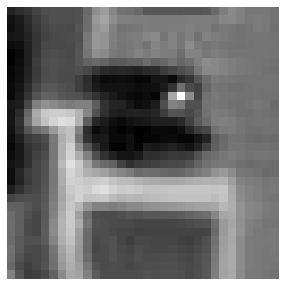

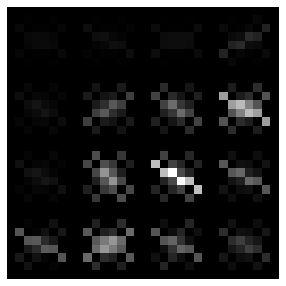

In [70]:
pixel_features = get_features(train_img, feat_name='pixels')
hog_features = get_features(train_img, feat_name='hog')

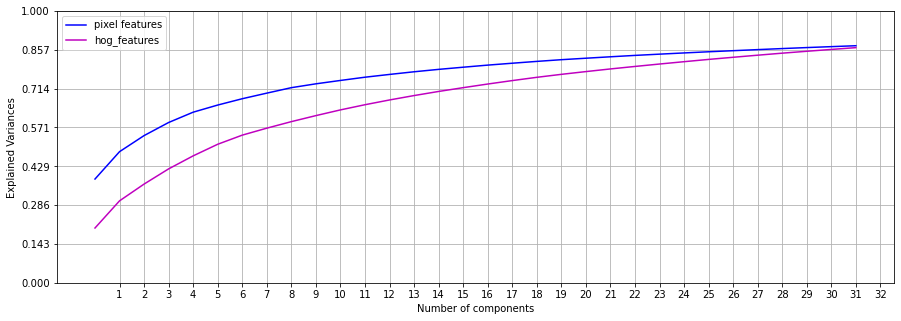

In [72]:
x = plot_PCA([pixel_features, hog_features], n_components=32)

In [78]:
X_pixels_pca, X_hog_pca = get_PCA([pixel_features, hog_features], n_components=2)[-1]
X_pixels_tsne, X_hog_tsne = get_tsne([pixel_features, hog_features], n_components=2)

In [79]:
def plot_classes(X, y, ax, title):
    # color code each cluster (person ID)
    colormap = plt.cm.tab20
    colorst = [colormap(i) for i in np.linspace(0, 1.0, len(np.unique(y)))]

    # project the features into 2 dimensions
    for k in range(len(np.unique(y))):
        ax.scatter(X[y==k, 0], X[y==k, 1], alpha=0.5, facecolors=colorst[k])
    ax.set_title(title)

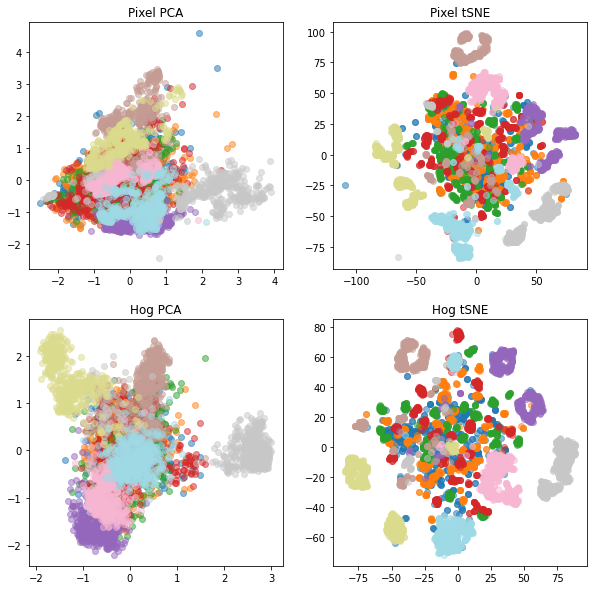

In [81]:
# plot results
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(10,10))

# y is the class labels (person ID)
plot_classes( X_pixels_pca, train_label, ax[0,0], title='Pixel PCA')
plot_classes(X_pixels_tsne, train_label, ax[0,1], title='Pixel tSNE')

plot_classes( X_hog_pca, train_label, ax[1,0], title='Hog PCA')
plot_classes(X_hog_tsne, train_label, ax[1,1], title='Hog tSNE')

plt.show()

In [82]:
# apply tSNE to only top 10 PCA components of pixel features 
X_pixels_PCA_tsne = get_tsne([get_PCA([pixel_features], n_components=10)[-1][0]], n_components=2)[0]

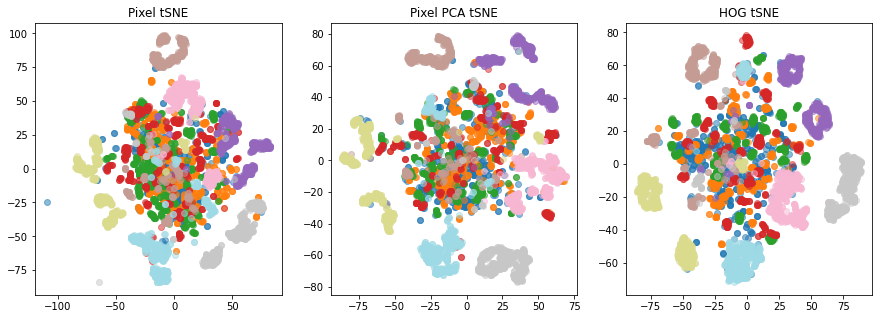

In [83]:
# plot results
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15,5))

# y is the class labels
plot_classes(X_pixels_tsne, train_label, ax[0], title='Pixel tSNE')
plot_classes(X_pixels_PCA_tsne, train_label, ax[1], title='Pixel PCA tSNE')
plot_classes(X_hog_tsne, train_label, ax[2], title='HOG tSNE')
plt.show()

## Add Shape Information to Dev Set Dataframe (Required)

In [18]:
# REQUIRED

# Measure time required to run code
start_time = time.time() 

# Initialize filtered labels and shapes dataframe to store labels for shapes that are filtered 
# to acceptable areas/sizes and dataframes that contain the shape information
filtered_labels = []
cols = ['filename', 'image_label', 'label', 'centroid', 'area', 'centroid-0', 'centroid-1', 'orientation', 'perimeter', 'major_axis_length', 'minor_axis_length', 'axis_ratio']
dev_shapes_df = pd.DataFrame(columns = cols)


for i in range(10): # Iterate through all 10 labels

    for index, row in dev[dev['label'] == i].iterrows(): # Iterate through all dev data rows that correspond to label i
        # Get filename and path to image
        filename = row['eo_img']
        path_eo = rootdir + "/" + str(i) + "/" + filename
        
        # Read image
        img_eo = cv2.imread(path_eo)

        # Convert to graycsale
        img_gray = cv2.cvtColor(img_eo, cv2.COLOR_BGR2GRAY)

        # Blur the image for better edge detection
        img_blur = cv2.GaussianBlur(img_gray, (3,3), 0)

        # Uncomment this if not blurring
        # img_blur = img_gray

        # Sobel Edge Detection
        sobelx = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=3) # Sobel Edge Detection on the X axis
        sobely = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=3) # Sobel Edge Detection on the Y axis
        sobelxy = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=3) # Combined X and Y Sobel Edge Detection

        # Canny Edge Detection
        edges = cv2.Canny(image=img_blur, threshold1=0, threshold2=100) # Canny Edge Detection

        # Identify centroids based on edges detected
        # https://scikit-image.org/docs/stable/auto_examples/segmentation/plot_regionprops.html
        label_img = label(edges)
        regions = regionprops(label_img)

        # Initialize list for storing filtered labels for the conditions for dimensions and area specified
        filtered_labels = []
        
        # Iterate through all centroids identified in the image
        for props in regions:
            # Generate major to minor axis ratio 
            axis_ratio = props.major_axis_length/props.minor_axis_length if props.minor_axis_length != 0 else 0
            
            # Filter for specific shapes that correspond to vehicle dimensions and sizes
            if  ((props.area < 60) and (props.area > 10) and (axis_ratio < 3.5)) or ((props.area < 200) and (props.area > 60) and (axis_ratio > 3) and (axis_ratio < 6)):
                # Add the centroid label number to the filtered_labels list
                filtered_labels.append(props.label)
                
                ## Get the coordinates of the centroid (center, orientation, and major/minor axis coordinate locations
                ## Optional because we will be getting this data through the regionprops_table command also 
                # y0, x0 = props.centroid
                # orientation = props.orientation
                # x1 = x0 + math.cos(orientation) * 0.5 * props.axis_minor_length
                # y1 = y0 - math.sin(orientation) * 0.5 * props.axis_minor_length
                # x2 = x0 - math.sin(orientation) * 0.5 * props.axis_major_length
                # y2 = y0 - math.cos(orientation) * 0.5 * props.axis_major_length
        
        # Store all centroid attributes in the props dataframe
        props = pd.DataFrame(regionprops_table(label_img, properties=('label',
                                                                      'centroid', # Provides coordinates of center of centroid relative to top left corner (centroid-0 is row or y-coordinate, centroid-1 is column or x-coordinate)
                                                                      'area', # number of pixels of the region scaled by pixel-area
                                                                      'orientation', # Relative to 12-oclock position, in radians. Positive is counter-clockwise, negative is clockwise. 
                                                                      'perimeter',
                                                                      'major_axis_length', 
                                                                      'minor_axis_length')))
        # Filter for only the centroids with dimensions and area specified
        filtered_props = props[props['label'].isin(filtered_labels)]
        
        # Store the single centroid with the largest area in the image in the dev_shapes_df. 
        if filtered_props.size > 0: # If there is 1 or more centroid identified
            sr = filtered_props.loc[filtered_props['area'].idxmax()].copy()
            sr['axis_ratio'] = sr['major_axis_length']/sr['minor_axis_length'] if sr['minor_axis_length'] != 0 else 0
            sr['filename'] = filename
            sr['image_label'] = i
            dev_shapes_df = dev_shapes_df.append(sr, ignore_index=True)
        else:
            dev_shapes_df.loc[dev_shapes_df.shape[0]] = [filename, None, None, None, None, None, None, None, None, None, None, None]

    end_time = time.time()
    print("Time stamp for running label {}: {}".format(i, (end_time - start_time)))

Time stamp for running label 0: 0.6981034278869629
Time stamp for running label 1: 1.3770222663879395
Time stamp for running label 2: 2.0141122341156006
Time stamp for running label 3: 2.646109104156494
Time stamp for running label 4: 3.276094913482666
Time stamp for running label 5: 3.989102602005005
Time stamp for running label 6: 4.626002311706543
Time stamp for running label 7: 5.266998529434204
Time stamp for running label 8: 5.891094446182251
Time stamp for running label 9: 6.660096645355225


In [19]:
dev_shapes_df

,filename,image_label,label,centroid,area,centroid-0,centroid-1,orientation,perimeter,major_axis_length,minor_axis_length,axis_ratio
0,EO_448028.png,0,2.0,NaN,41.0,27.560976,12.707317,1.479529,41.207107,20.738177,8.622735,2.405058
1,EO_272385.png,0,5.0,NaN,56.0,16.035714,14.785714,1.510921,53.278175,17.218033,11.054990,1.557490
2,EO_323237.png,0,3.0,NaN,42.0,13.904762,18.428571,-1.507002,44.106602,15.486002,11.150692,1.388793
3,EO_403244.png,0,3.0,NaN,34.0,16.470588,13.235294,0.621885,34.863961,14.320991,8.698082,1.646454
4,EO_349881.png,0,8.0,NaN,59.0,24.525424,18.593220,-1.239087,57.763456,26.310956,10.391872,2.531878
...,...,...,...,...,...,...,...,...,...,...,...,...
619,EO_273822.png,9,2.0,NaN,48.0,16.333333,17.270833,1.249209,51.349242,18.101546,10.118430,1.788968
620,EO_107085.png,9,4.0,NaN,43.0,18.883721,17.395349,1.279910,42.414214,18.424972,8.762420,2.102726
621,EO_9194.png,9,8.0,NaN,45.0,17.177778,19.133333,1.512414,43.071068,13.280868,9.231924,1.438581
622,EO_79534.png,9,6.0,NaN,49.0,16.448980,23.306122,1.320001,47.692388,18.841995,8.652559,2.177621


In [20]:
dev_shapes_df.to_csv('dev_shapes_df.csv')

## Add Shape Information to Test Set Dataframe (Required)

In [21]:
# REQUIRED

# Measure time required to run code
start_time = time.time() 

# Initialize filtered labels and shapes dataframe to store labels for shapes that are filtered 
# to acceptable areas/sizes and dataframes that contain the shape information
filtered_labels = []
cols = ['filename', 'image_label', 'label', 'centroid', 'area', 'centroid-0', 'centroid-1', 'orientation', 'perimeter', 'major_axis_length', 'minor_axis_length', 'axis_ratio']
test_shapes_df = pd.DataFrame(columns = cols)


for i in range(10): # Iterate through all 10 labels

    for index, row in test[test['label'] == i].iterrows(): # Iterate through all test data rows that correspond to label i
        # Get filename and path to image
        filename = row['eo_img']
        path_eo = rootdir + "/" + str(i) + "/" + filename
        
        # Read image
        img_eo = cv2.imread(path_eo)

        # Convert to graycsale
        img_gray = cv2.cvtColor(img_eo, cv2.COLOR_BGR2GRAY)

        # Blur the image for better edge detection
        img_blur = cv2.GaussianBlur(img_gray, (3,3), 0)

        # Uncomment this if not blurring
        # img_blur = img_gray

        # Sobel Edge Detection
        sobelx = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=3) # Sobel Edge Detection on the X axis
        sobely = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=3) # Sobel Edge Detection on the Y axis
        sobelxy = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=3) # Combined X and Y Sobel Edge Detection

        # Canny Edge Detection
        edges = cv2.Canny(image=img_blur, threshold1=0, threshold2=100) # Canny Edge Detection

        # Identify centroids based on edges detected
        # https://scikit-image.org/docs/stable/auto_examples/segmentation/plot_regionprops.html
        label_img = label(edges)
        regions = regionprops(label_img)

        # Initialize list for storing filtered labels for the conditions for dimensions and area specified
        filtered_labels = []
        
        # Iterate through all centroids identified in the image
        for props in regions:
            # Generate major to minor axis ratio 
            axis_ratio = props.major_axis_length/props.minor_axis_length if props.minor_axis_length != 0 else 0
            
            # Filter for specific shapes that correspond to vehicle dimensions and sizes
            if  ((props.area < 60) and (props.area > 10) and (axis_ratio < 3.5)) or ((props.area < 200) and (props.area > 60) and (axis_ratio > 3) and (axis_ratio < 6)):
                # Add the centroid label number to the filtered_labels list
                filtered_labels.append(props.label)
                
                ## Get the coordinates of the centroid (center, orientation, and major/minor axis coordinate locations
                ## Optional because we will be getting this data through the regionprops_table command also 
                # y0, x0 = props.centroid
                # orientation = props.orientation
                # x1 = x0 + math.cos(orientation) * 0.5 * props.axis_minor_length
                # y1 = y0 - math.sin(orientation) * 0.5 * props.axis_minor_length
                # x2 = x0 - math.sin(orientation) * 0.5 * props.axis_major_length
                # y2 = y0 - math.cos(orientation) * 0.5 * props.axis_major_length
        
        # Store all centroid attributes in the props dataframe
        props = pd.DataFrame(regionprops_table(label_img, properties=('label',
                                                                      'centroid', # Provides coordinates of center of centroid relative to top left corner (centroid-0 is row or y-coordinate, centroid-1 is column or x-coordinate)
                                                                      'area', # number of pixels of the region scaled by pixel-area
                                                                      'orientation', # Relative to 12-oclock position, in radians. Positive is counter-clockwise, negative is clockwise. 
                                                                      'perimeter',
                                                                      'major_axis_length', 
                                                                      'minor_axis_length')))
        # Filter for only the centroids with dimensions and area specified
        filtered_props = props[props['label'].isin(filtered_labels)]
        
        # Store the single centroid with the largest area in the image in the test_shapes_df. 
        if filtered_props.size > 0: # If there is 1 or more centroid identified
            sr = filtered_props.loc[filtered_props['area'].idxmax()].copy()
            sr['axis_ratio'] = sr['major_axis_length']/sr['minor_axis_length'] if sr['minor_axis_length'] != 0 else 0
            sr['filename'] = filename
            sr['image_label'] = i
            test_shapes_df = test_shapes_df.append(sr, ignore_index=True)
        else:
            test_shapes_df.loc[test_shapes_df.shape[0]] = [filename, None, None, None, None, None, None, None, None, None, None, None]

    end_time = time.time()
    print("Time stamp for running label {}: {}".format(i, (end_time - start_time)))

Time stamp for running label 0: 0.6590023040771484
Time stamp for running label 1: 1.3019976615905762
Time stamp for running label 2: 1.9470016956329346
Time stamp for running label 3: 2.6640021800994873
Time stamp for running label 4: 3.3199985027313232
Time stamp for running label 5: 4.039024353027344
Time stamp for running label 6: 4.715019226074219
Time stamp for running label 7: 5.409998893737793
Time stamp for running label 8: 6.0699992179870605
Time stamp for running label 9: 6.957998752593994


In [22]:
test_shapes_df

,filename,image_label,label,centroid,area,centroid-0,centroid-1,orientation,perimeter,major_axis_length,minor_axis_length,axis_ratio
0,EO_56494.png,0,3.0,NaN,25.0,12.040000,18.920000,1.152769,22.828427,11.570930,7.137617,1.621119
1,EO_367734.png,0,1.0,NaN,54.0,4.907407,16.407407,1.400887,57.142136,17.620824,10.717362,1.644138
2,EO_471775.png,0,2.0,NaN,29.0,6.896552,16.827586,1.535874,30.242641,15.941427,6.399078,2.491207
3,EO_50489.png,0,6.0,NaN,22.0,15.818182,17.363636,1.362163,22.828427,11.186244,6.399265,1.748051
4,EO_130042.png,0,3.0,NaN,24.0,27.000000,16.291667,-0.158311,24.242641,10.942165,8.769715,1.247722
...,...,...,...,...,...,...,...,...,...,...,...,...
619,EO_109796.png,9,2.0,NaN,44.0,16.840909,17.863636,1.176587,46.313708,18.583561,10.363557,1.793164
620,EO_318838.png,9,1.0,NaN,28.0,9.964286,25.928571,-1.399976,27.242641,12.219878,8.992122,1.358954
621,EO_469542.png,9,5.0,NaN,14.0,25.000000,24.500000,1.570796,12.000000,16.124515,0.000000,0.000000
622,EO_195765.png,9,4.0,NaN,45.0,17.022222,17.422222,1.307351,45.692388,18.135596,8.152432,2.224563


In [23]:
test_shapes_df.to_csv('test_shapes_df.csv')

# Shape Detection - Alternate (Not Used)

In [78]:
img_blur.max()

0.8414216

Area of rectangle using findContours: 22.5
Area of rectangle using argwhere: 2.5


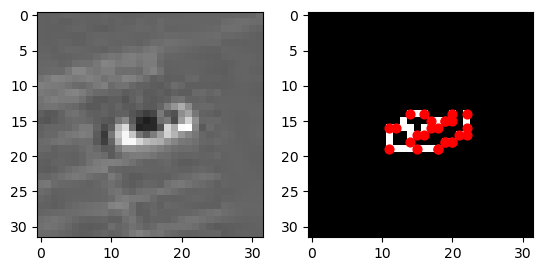

In [63]:
# img = cv2.imread('/content/EO_1839.png')
# gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# thresh_img = cv2.threshold(gray_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

# Method 1: Using Canny Edge
thresh_img = edges # Edit from Justin's code
cnts = cv2.findContours(thresh_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
# print(cnts[1])
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
# print(cnts[0][0][0])

for cnt in cnts:
    approx = cv2.contourArea(cnt)
    print("Area of rectangle using findContours:", approx) # Prints area of shape? Can we get dimensions also?

# What if we use argwhere on the threshold image instead?
cnts2 = np.argwhere(thresh_img > 0)
approx2 = cv2.contourArea(cnts2)
print("Area of rectangle using argwhere:", approx2) # Prints area of shape? Can we get dimensions also?

fig, ax = plt.subplots(1, 2)
ax[0].imshow(img, cmap="gray")
ax[1].imshow(thresh_img, cmap="gray")
for p in range(len(cnts[0])):
    ax[1].scatter(x = [cnts[0][p][0][0]], y = [cnts[0][p][0][1]], c = 'r', s = 40)
plt.show()

9.0


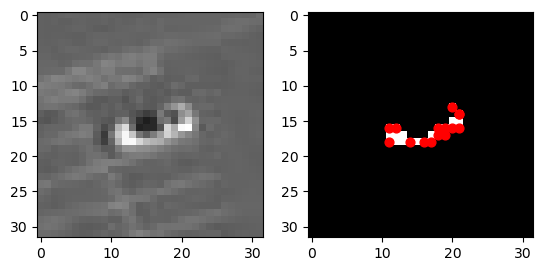

In [61]:
# Using find contours to get the edges

gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

thresh_img = cv2.threshold(gray_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

cnts = cv2.findContours(thresh_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
for cnt in cnts:
    approx = cv2.contourArea(cnt)
    print(approx)

fig, ax = plt.subplots(1, 2)
ax[0].imshow(img, cmap="gray")
ax[1].imshow(thresh_img, cmap="gray")
for p in range(len(cnts[0])):
    ax[1].scatter(x = [cnts[0][p][0][0]], y = [cnts[0][p][0][1]], c = 'r', s = 40)
plt.show()

EO_100008.png
Area of rectangle using findContours: 3.0
Area of rectangle using findContours: 0.0
EO_100136.png
Area of rectangle using findContours: 8.0
Area of rectangle using findContours: 3.0
Area of rectangle using findContours: 43.0
EO_100096.png
Area of rectangle using findContours: 111.5
Area of rectangle using findContours: 3.5
EO_100270.png
Area of rectangle using findContours: 3.5
Area of rectangle using findContours: 5.5
Area of rectangle using findContours: 2.5
EO_101380.png
Area of rectangle using findContours: 3.0
Area of rectangle using findContours: 39.5
Area of rectangle using findContours: 5.0
Area of rectangle using findContours: 1.5
EO_104216.png
Area of rectangle using findContours: 0.0
Area of rectangle using findContours: 0.5
Area of rectangle using findContours: 0.5
Area of rectangle using findContours: 1.5
Area of rectangle using findContours: 3.5
Area of rectangle using findContours: 76.0
Area of rectangle using findContours: 2.5
EO_103521.png
Area of rectang

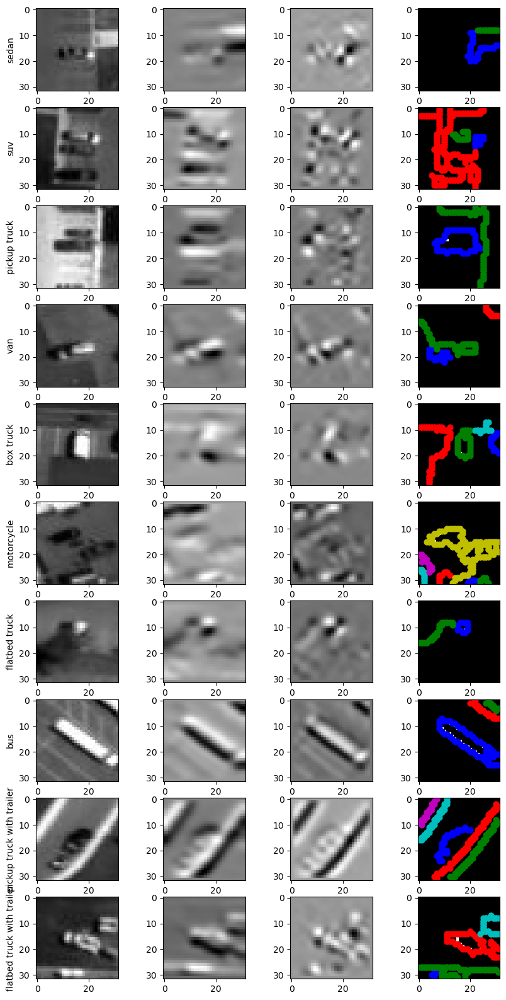

In [181]:
# Approach taken from least squares exercise
# Set labels and image # to access

# Display Plots

# Initialize eo and sar thresholding images and filenames to save for later
eo_im_thresholds = []
eo_im_filenames = []

fig, ax = plt.subplots(10, 4, figsize = (10, 20))
for i in range(10): # Folder or Label Number
    j = 9 # Image Number (randomnly chosen - can change to a loop if want to include more images)

    # Get path to images - Loop through each label
    eo_im_filenames.append(eo_filenames[i][j])
    path_eo = rootdir + "/" + str(i) + "/"  + eo_filenames[i][j]
    print(eo_filenames[i][j])
    
    # # Get path to images - Loop through images of the same label
    # eo_im_filenames.append(eo_filenames[i][j])
    # path_eo = rootdir + "/" + str(0) + "/"  + eo_filenames[0][i]
    # print(eo_filenames[i][j])

    # Read images
    img_eo = cv2.imread(path_eo)
    

    # Convert to graycsale
    img_gray = cv2.cvtColor(img_eo, cv2.COLOR_BGR2GRAY)
    
    ### Shirley's Addition ###
    # Blur the image for better edge detection
    img_blur = cv2.GaussianBlur(img_gray, (5,5), 0)
    
    # Try not blurring
    # img_blur = img_gray
    
    # Sobel Edge Detection
    sobelx = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5) # Sobel Edge Detection on the X axis
    sobely = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5) # Sobel Edge Detection on the Y axis
    sobelxy = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=5) # Combined X and Y Sobel Edge Detection

    # Alternate Method
    edges = cv2.Canny(image=img_blur, threshold1=0, threshold2=150) # Canny Edge Detection
    # Plot Rectangle(s)
    
    
    # Alternate Thresholding methods
    thresh_img = edges # Edit from Justin's code
    # thresh_img = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

    
    cnts = cv2.findContours(thresh_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    # print(cnts[1])
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    # print(cnts[0][0][0])

    for cnt in cnts:
        approx = cv2.contourArea(cnt)
        print("Area of rectangle using findContours:", approx) # Prints area of shape? Can we get dimensions also?

    # Plot EO
    
    ax[i][0].imshow(img_gray, cmap="gray")
    # cv2.waitKey(0)
    ax[i][1].imshow(sobely, cmap="gray")
    # cv2.waitKey(0)
    ax[i][2].imshow(sobelxy, cmap="gray")
    # cv2.waitKey(0)
    # Canny Edge Detection
    # Display Canny Edge Detection Image
    ax[i][3].imshow(thresh_img, cmap="gray")
    
    # print(cnts[0])
    color = {0: 'b', 1: 'g', 2:'r', 3:'c', 4:'m', 5:'y', 6:'k', 7:'w'}
    for c in range(len(cnts)):
        
        for p in range(len(cnts[c])):
            ax[i][3].scatter(x = [cnts[c][p][0][0]], y = [cnts[c][p][0][1]], c = color[c], s = 40)
    
    # Set label name for each row
    ax[i][0].set_ylabel(labels[i])
    
plt.show()

1. Increase sensitivity to detect the rectangles
2. Use the largest area / rectangle as the detected object
3. Plot the distribution of the areas + diagonals for each label to determine if there is a trend observed
4. Generate a training table (with randomnly selected 500 files each?) that contains image file name, area, diagonal, and label associated with it
5. Use area and diagonal (two furthest points) to use as features, plug into k-means


EO_100009.png
Area of rectangle using findContours: 0.0
Area of rectangle using findContours: 62.0
EO_100155.png
Area of rectangle using findContours: 0.0
Area of rectangle using findContours: 0.0
Area of rectangle using findContours: 2.0
Area of rectangle using findContours: 1.5
Area of rectangle using findContours: 0.0
Area of rectangle using findContours: 0.0
Area of rectangle using findContours: 2.0
Area of rectangle using findContours: 4.0
Area of rectangle using findContours: 3.0
Area of rectangle using findContours: 4.5
Area of rectangle using findContours: 0.0
Area of rectangle using findContours: 0.0
Area of rectangle using findContours: 0.0
EO_100184.png
Area of rectangle using findContours: 0.0
Area of rectangle using findContours: 0.0
Area of rectangle using findContours: 0.0
Area of rectangle using findContours: 0.0
Area of rectangle using findContours: 0.0
Area of rectangle using findContours: 0.0
Area of rectangle using findContours: 0.0
Area of rectangle using findConto

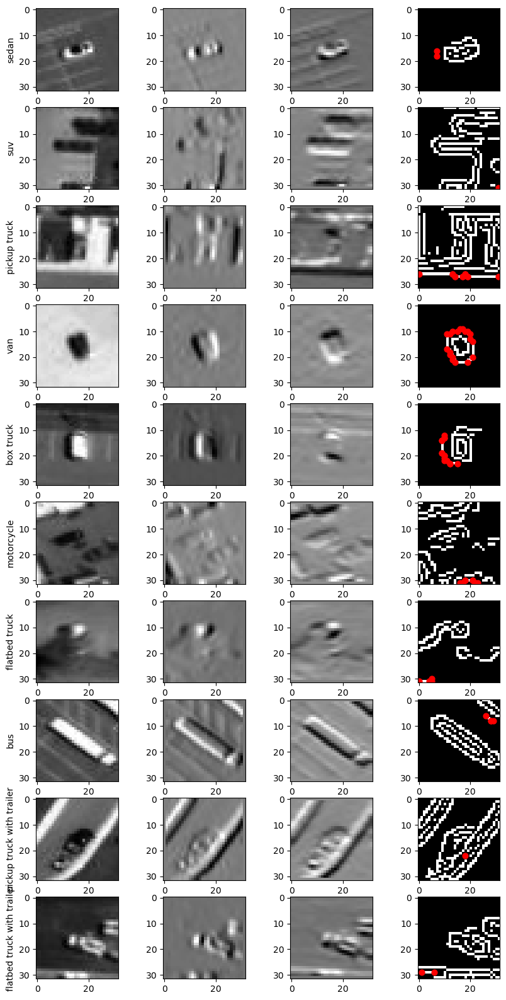

In [117]:
# Approach taken from least squares exercise
# Set labels and image # to access

# Display Plots

# Initialize eo and sar thresholding images and filenames to save for later
eo_im_thresholds = []
eo_im_filenames = []

fig, ax = plt.subplots(10, 4, figsize = (10, 20))
for i in range(10): # Folder or Label Number
    j = 10 # Image Number (randomnly chosen - can change to a loop if want to include more images)

    # Get path to images
    eo_im_filenames.append(eo_filenames[i][j])
    path_eo = rootdir + "/" + str(i) + "/"  + eo_filenames[i][j]
    print(eo_filenames[i][j])

    # Read images
    img_eo = plt.imread(path_eo)
    
    # Normalize images
    if np.max(img_eo)>1:
        img_eo = normalize(img_eo)
        
    # Compute edges of the EO image 
    # TODO: decide the ksize for extracting the edges
    eo_sobelx = cv2.Sobel(img_eo,cv2.CV_32F,1,0, ksize=3) # Find x and y gradients
    eo_sobely = cv2.Sobel(img_eo,cv2.CV_32F,0,1, ksize=3)
    eo_magnitude = np.sqrt(eo_sobelx**2.0 + eo_sobely**2.0)
    eo_magnitude = eo_magnitude/np.max(eo_magnitude) # normalize
    
    # Compute EO thresholds
    eo_im_threshold = cv2.Canny(image=(eo_magnitude*255).astype(np.uint8), threshold1=200, threshold2=255) # Canny Edge 
    # eo_im_threshold = eo_im_threshold / np.max(eo_im_threshold) # normalize
    
    # Plot Rectangle(s)
    thresh_img = eo_im_threshold # Edit from Justin's code
    cnts = cv2.findContours(thresh_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    # print(cnts[1])
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    # print(cnts[0][0][0])

    for cnt in cnts:
        approx = cv2.contourArea(cnt)
        print("Area of rectangle using findContours:", approx) # Prints area of shape? Can we get dimensions also?

    # Plot EO
    
    ax[i][0].imshow(img_eo, cmap="gray")
    # cv2.waitKey(0)
    ax[i][1].imshow(eo_sobelx, cmap="gray")
    # cv2.waitKey(0)
    ax[i][2].imshow(eo_sobely, cmap="gray")
    # cv2.waitKey(0)
    # Canny Edge Detection
    # Display Canny Edge Detection Image
    ax[i][3].imshow(thresh_img, cmap="gray")

    for p in range(len(cnts[0])):
        ax[i][3].scatter(x = [cnts[0][p][0][0]], y = [cnts[0][p][0][1]], c = 'r', s = 40)
    
    # Set label name for each row
    ax[i][0].set_ylabel(labels[i])
    
plt.show()

In [ ]:

    
    # Compute edges of the EO image 
    # TODO: decide the ksize for extracting the edges
    eo_sobelx = cv2.Sobel(img_eo,cv2.CV_32F,1,0, ksize=3) # Find x and y gradients
    eo_sobely = cv2.Sobel(img_eo,cv2.CV_32F,0,1, ksize=3)
    eo_magnitude = np.sqrt(eo_sobelx**2.0 + eo_sobely**2.0)
    eo_magnitude = eo_magnitude/np.max(eo_magnitude) # normalize
    
    # Compute EO thresholds
    eo_im_threshold = cv2.Canny(image=(eo_magnitude*255).astype(np.uint8), threshold1=200, threshold2=255) # Canny Edge 
    eo_im_threshold = eo_im_threshold / np.max(eo_im_threshold) # normalize
    eo_im_thresholds.append(eo_im_threshold)

# K-Nearest Neighbors

In [45]:
# Default Parameters (image size of 32x32
area = 32*32
perimeter = 32*4
axis_major_length = np.sqrt(32**2 + 32**2)
axis_minor_length = np.sqrt(32**2 + 32**2)


In [46]:
# For NaNs, replace with the image area/perimeter/dimensions itself
train_copy = training_shapes_df[['image_label', 'area', 'perimeter', 'axis_major_length', 'axis_minor_length']].copy(deep = True)
for index, row in train_copy.iterrows():
    if row.isnull().values.any():
        row['area'] = area
        row['perimeter'] = perimeter
        row['axis_major_length'] = axis_major_length
        row['axis_minor_length'] = axis_minor_length

dev_copy = dev_shapes_df[['image_label', 'area', 'perimeter', 'axis_major_length', 'axis_minor_length']].copy(deep = True)
for index, row in dev_copy.iterrows():
    if row.isnull().values.any():
        row['area'] = area
        row['perimeter'] = perimeter
        row['axis_major_length'] = axis_major_length
        row['axis_minor_length'] = axis_minor_length

        
test_copy = test_shapes_df[['image_label', 'area', 'perimeter', 'axis_major_length', 'axis_minor_length']].copy(deep = True)
for index, row in test_copy.iterrows():
    if row.isnull().values.any():
        row['area'] = area
        row['perimeter'] = perimeter
        row['axis_major_length'] = axis_major_length
        row['axis_minor_length'] = axis_minor_length

In [47]:
# training_shapes_df.drop(drop_columns, axis=1)
print("Train Num Rows from {} to {}".format(training_shapes_df.shape[0], train_copy.shape[0]))
print("Dev Num Rows from {} to {}".format(dev_shapes_df.shape[0], dev_copy.shape[0]))
print("Test Num Rows from {} to {}".format(test_shapes_df.shape[0], test_copy.shape[0]))
print("Dev to Train Ratio:", dev_shapes_df.shape[0]/training_shapes_df.shape[0])
print("Test to Train Ratio:", test_shapes_df.shape[0]/training_shapes_df.shape[0])
train_copy.head()

Train Num Rows from 4992 to 4992
Dev Num Rows from 624 to 624
Test Num Rows from 624 to 624
Dev to Train Ratio: 0.125
Test to Train Ratio: 0.125


,image_label,area,perimeter,axis_major_length,axis_minor_length
0,0,31.0,29.414214,24.708648,10.952404
1,0,25.0,25.414214,10.226401,5.535334
2,0,1024,128,45.254834,45.254834
3,0,1024,128,45.254834,45.254834
4,0,42.0,42.071068,19.196191,11.528753


In [48]:
for i in range(10):
    print("Number of images in training data for label", i, ":", training_shapes_df[training_shapes_df['image_label'] == i].shape[0])

Number of images in training data for label 0 : 499
Number of images in training data for label 1 : 499
Number of images in training data for label 2 : 500
Number of images in training data for label 3 : 500
Number of images in training data for label 4 : 499
Number of images in training data for label 5 : 499
Number of images in training data for label 6 : 499
Number of images in training data for label 7 : 499
Number of images in training data for label 8 : 499
Number of images in training data for label 9 : 499


In [49]:
dev_num_images = []
test_num_images = []
for i in range(10):
    print("Number of images in dev data for label", i, ":", dev_shapes_df[dev_shapes_df['image_label'] == i].shape[0])
    dev_num_images.append(dev_shapes_df[dev_shapes_df['image_label'] == i].shape[0])
print()
for i in range(10):
    print("Number of images in test data for label", i, ":", test_shapes_df[test_shapes_df['image_label'] == i].shape[0])
    test_num_images.append(test_shapes_df[test_shapes_df['image_label'] == i].shape[0])

Number of images in dev data for label 0 : 62
Number of images in dev data for label 1 : 63
Number of images in dev data for label 2 : 62
Number of images in dev data for label 3 : 62
Number of images in dev data for label 4 : 63
Number of images in dev data for label 5 : 63
Number of images in dev data for label 6 : 62
Number of images in dev data for label 7 : 63
Number of images in dev data for label 8 : 62
Number of images in dev data for label 9 : 62

Number of images in test data for label 0 : 63
Number of images in test data for label 1 : 62
Number of images in test data for label 2 : 62
Number of images in test data for label 3 : 62
Number of images in test data for label 4 : 62
Number of images in test data for label 5 : 62
Number of images in test data for label 6 : 63
Number of images in test data for label 7 : 62
Number of images in test data for label 8 : 63
Number of images in test data for label 9 : 63


In [50]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler

# Standardize the variables: https://medium.datadriveninvestor.com/implementing-k-nearest-neighbors-with-python-1c0b7cdf85f2
scaler = StandardScaler()


X_train_scaled = scaler.fit_transform(train_copy.drop('image_label', axis=1))
X_dev_scaled = scaler.fit_transform(dev_copy.drop('image_label', axis=1))
X_test_scaled = scaler.fit_transform(test_copy.drop('image_label', axis=1))

y_drop_columns = ['area', 'perimeter', 'axis_major_length', 'axis_minor_length']
Y_train = np.array(train_copy['image_label'])
Y_dev = np.array(dev_copy['image_label'])
Y_test = np.array(test_copy['image_label'])




In [51]:
for i in range(10):
    train_copy[train_copy['image_label'] == i]

In [52]:
Y_train=Y_train.astype('int')
Y_dev=Y_dev.astype('int')
Y_test=Y_test.astype('int')
Y_train

array([0, 0, 0, ..., 9, 9, 9])

In [53]:

classifier = KNeighborsClassifier(n_neighbors = 5, metric = 'minkowski', p = 2)
classifier.fit(X_train_scaled, Y_train)

# Predicting the Test set results
y_dev_pred = classifier.predict(X_dev_scaled)

# Making the Confusion Matrix
# Confusion matrix whose i-th row and j-th column entry indicates 
# the number of samples with true label being i-th class and predicted label being j-th class.
# Rows = True, Columns = Predicted

from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(Y_dev, y_dev_pred)
ac = accuracy_score(Y_dev, y_dev_pred )


In [54]:
len(np.argwhere(y_dev_pred == 0))

148

In [55]:
print("Accuracy Score:", ac)
print("Confusion Matrix:", cm)

Accuracy Score: 0.33653846153846156
Confusion Matrix: [[17  9  7  5  6  6  5  0  5  2]
 [20  9  2  5  4  7  5  1  3  7]
 [19 10  6  4  3  6  3  1  6  4]
 [19 13  3  6  7  4  6  0  2  2]
 [ 5  8  4  5 32  3  3  0  2  1]
 [14 11  3  4  2 17  5  1  1  5]
 [ 8  4  5  3  5  5 25  0  6  1]
 [14  0  0  1  0  0  0 46  2  0]
 [20  3  1  4  0  2  5  1 26  0]
 [12  6  2  3  3  5  1  3  1 26]]


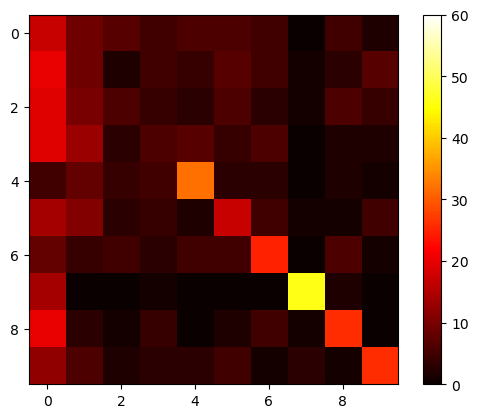

In [56]:
# Plot Confusion Matrix

plt.imshow(cm, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.clim(0, 60) 
plt.show()

In [57]:
print(np.diag(cm) / test_num_images)

[0.26984127 0.14516129 0.09677419 0.09677419 0.51612903 0.27419355
 0.3968254  0.74193548 0.41269841 0.41269841]


In [67]:
# Accuracy scores for each label:

for i in range(10):
    print("Accuracy score for label {} ({}): {}".format(i, labels[i], cm[i][i]/test_num_images[i]))


Accuracy score for label 0 (sedan): 0.2698412698412698
Accuracy score for label 1 (suv): 0.14516129032258066
Accuracy score for label 2 (pickup truck): 0.0967741935483871
Accuracy score for label 3 (van): 0.0967741935483871
Accuracy score for label 4 (box truck): 0.5161290322580645
Accuracy score for label 5 (motorcycle): 0.27419354838709675
Accuracy score for label 6 (flatbed truck): 0.3968253968253968
Accuracy score for label 7 (bus): 0.7419354838709677
Accuracy score for label 8 (pickup truck with trailer): 0.4126984126984127
Accuracy score for label 9 (flatbed truck with trailer): 0.4126984126984127
